# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
#!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162193.jpg  
  inflating: processed_celeba_small/celeba/162194.jpg  
  inflating: processed_celeba_small/celeba/162195.jpg  
  inflating: processed_celeba_small/celeba/162196.jpg  
  inflating: processed_celeba_small/celeba/162197.jpg  
  inflating: processed_celeba_small/celeba/162198.jpg  
  inflating: processed_celeba_small/celeba/162199.jpg  
  inflating: processed_celeba_small/celeba/162200.jpg  
  inflating: processed_celeba_small/celeba/162201.jpg  
  inflating: processed_celeba_small/celeba/162202.jpg  
  inflating: processed_celeba_small/celeba/162203.jpg  
  inflating: processed_celeba_small/celeba/162204.jpg  
  inflating: processed_celeba_small/celeba/162205.jpg  
  inflating: processed_celeba_small/celeba/162206.jpg  
  inflating: processed_celeba_small/celeba/162207.jpg  
  inflating: processed_celeba_small/celeba/162208.jpg  
  inflating: processed_celeba_small/celeba/162209.jpg  
  inflating: processed_celeba_small/celeba/16221

  inflating: processed_celeba_small/celeba/162483.jpg  
  inflating: processed_celeba_small/celeba/162484.jpg  
  inflating: processed_celeba_small/celeba/162485.jpg  
  inflating: processed_celeba_small/celeba/162486.jpg  
  inflating: processed_celeba_small/celeba/162487.jpg  
  inflating: processed_celeba_small/celeba/162488.jpg  
  inflating: processed_celeba_small/celeba/162489.jpg  
  inflating: processed_celeba_small/celeba/162490.jpg  
  inflating: processed_celeba_small/celeba/162491.jpg  
  inflating: processed_celeba_small/celeba/162492.jpg  
  inflating: processed_celeba_small/celeba/162493.jpg  
  inflating: processed_celeba_small/celeba/162494.jpg  
  inflating: processed_celeba_small/celeba/162495.jpg  
  inflating: processed_celeba_small/celeba/162496.jpg  
  inflating: processed_celeba_small/celeba/162497.jpg  
  inflating: processed_celeba_small/celeba/162498.jpg  
  inflating: processed_celeba_small/celeba/162499.jpg  
  inflating: processed_celeba_small/celeba/16250

  inflating: processed_celeba_small/celeba/162811.jpg  
  inflating: processed_celeba_small/celeba/162812.jpg  
  inflating: processed_celeba_small/celeba/162813.jpg  
  inflating: processed_celeba_small/celeba/162814.jpg  
  inflating: processed_celeba_small/celeba/162815.jpg  
  inflating: processed_celeba_small/celeba/162816.jpg  
  inflating: processed_celeba_small/celeba/162817.jpg  
  inflating: processed_celeba_small/celeba/162818.jpg  
  inflating: processed_celeba_small/celeba/162819.jpg  
  inflating: processed_celeba_small/celeba/162820.jpg  
  inflating: processed_celeba_small/celeba/162821.jpg  
  inflating: processed_celeba_small/celeba/162822.jpg  
  inflating: processed_celeba_small/celeba/162823.jpg  
  inflating: processed_celeba_small/celeba/162824.jpg  
  inflating: processed_celeba_small/celeba/162825.jpg  
  inflating: processed_celeba_small/celeba/162826.jpg  
  inflating: processed_celeba_small/celeba/162827.jpg  
  inflating: processed_celeba_small/celeba/16282

  inflating: processed_celeba_small/celeba/162959.jpg  
  inflating: processed_celeba_small/celeba/162960.jpg  
  inflating: processed_celeba_small/celeba/162961.jpg  
  inflating: processed_celeba_small/celeba/162962.jpg  
  inflating: processed_celeba_small/celeba/162963.jpg  
  inflating: processed_celeba_small/celeba/162964.jpg  
  inflating: processed_celeba_small/celeba/162965.jpg  
  inflating: processed_celeba_small/celeba/162966.jpg  
  inflating: processed_celeba_small/celeba/162967.jpg  
  inflating: processed_celeba_small/celeba/162968.jpg  
  inflating: processed_celeba_small/celeba/162969.jpg  
  inflating: processed_celeba_small/celeba/162970.jpg  
  inflating: processed_celeba_small/celeba/162971.jpg  
  inflating: processed_celeba_small/celeba/162972.jpg  
  inflating: processed_celeba_small/celeba/162973.jpg  
  inflating: processed_celeba_small/celeba/162974.jpg  
  inflating: processed_celeba_small/celeba/162975.jpg  
  inflating: processed_celeba_small/celeba/16297

  inflating: processed_celeba_small/celeba/163270.jpg  
  inflating: processed_celeba_small/celeba/163271.jpg  
  inflating: processed_celeba_small/celeba/163272.jpg  
  inflating: processed_celeba_small/celeba/163273.jpg  
  inflating: processed_celeba_small/celeba/163274.jpg  
  inflating: processed_celeba_small/celeba/163275.jpg  
  inflating: processed_celeba_small/celeba/163276.jpg  
  inflating: processed_celeba_small/celeba/163277.jpg  
  inflating: processed_celeba_small/celeba/163278.jpg  
  inflating: processed_celeba_small/celeba/163279.jpg  
  inflating: processed_celeba_small/celeba/163280.jpg  
  inflating: processed_celeba_small/celeba/163281.jpg  
  inflating: processed_celeba_small/celeba/163282.jpg  
  inflating: processed_celeba_small/celeba/163283.jpg  
  inflating: processed_celeba_small/celeba/163284.jpg  
  inflating: processed_celeba_small/celeba/163285.jpg  
  inflating: processed_celeba_small/celeba/163286.jpg  
  inflating: processed_celeba_small/celeba/16328

  inflating: processed_celeba_small/celeba/163426.jpg  
  inflating: processed_celeba_small/celeba/163427.jpg  
  inflating: processed_celeba_small/celeba/163428.jpg  
  inflating: processed_celeba_small/celeba/163429.jpg  
  inflating: processed_celeba_small/celeba/163430.jpg  
  inflating: processed_celeba_small/celeba/163431.jpg  
  inflating: processed_celeba_small/celeba/163432.jpg  
  inflating: processed_celeba_small/celeba/163433.jpg  
  inflating: processed_celeba_small/celeba/163434.jpg  
  inflating: processed_celeba_small/celeba/163435.jpg  
  inflating: processed_celeba_small/celeba/163436.jpg  
  inflating: processed_celeba_small/celeba/163437.jpg  
  inflating: processed_celeba_small/celeba/163438.jpg  
  inflating: processed_celeba_small/celeba/163439.jpg  
  inflating: processed_celeba_small/celeba/163440.jpg  
  inflating: processed_celeba_small/celeba/163441.jpg  
  inflating: processed_celeba_small/celeba/163442.jpg  
  inflating: processed_celeba_small/celeba/16344

  inflating: processed_celeba_small/celeba/163753.jpg  
  inflating: processed_celeba_small/celeba/163754.jpg  
  inflating: processed_celeba_small/celeba/163755.jpg  
  inflating: processed_celeba_small/celeba/163756.jpg  
  inflating: processed_celeba_small/celeba/163757.jpg  
  inflating: processed_celeba_small/celeba/163758.jpg  
  inflating: processed_celeba_small/celeba/163759.jpg  
  inflating: processed_celeba_small/celeba/163760.jpg  
  inflating: processed_celeba_small/celeba/163761.jpg  
  inflating: processed_celeba_small/celeba/163762.jpg  
  inflating: processed_celeba_small/celeba/163763.jpg  
  inflating: processed_celeba_small/celeba/163764.jpg  
  inflating: processed_celeba_small/celeba/163765.jpg  
  inflating: processed_celeba_small/celeba/163766.jpg  
  inflating: processed_celeba_small/celeba/163767.jpg  
  inflating: processed_celeba_small/celeba/163768.jpg  
  inflating: processed_celeba_small/celeba/163769.jpg  
  inflating: processed_celeba_small/celeba/16377

  inflating: processed_celeba_small/celeba/163905.jpg  
  inflating: processed_celeba_small/celeba/163906.jpg  
  inflating: processed_celeba_small/celeba/163907.jpg  
  inflating: processed_celeba_small/celeba/163908.jpg  
  inflating: processed_celeba_small/celeba/163909.jpg  
  inflating: processed_celeba_small/celeba/163910.jpg  
  inflating: processed_celeba_small/celeba/163911.jpg  
  inflating: processed_celeba_small/celeba/163912.jpg  
  inflating: processed_celeba_small/celeba/163913.jpg  
  inflating: processed_celeba_small/celeba/163914.jpg  
  inflating: processed_celeba_small/celeba/163915.jpg  
  inflating: processed_celeba_small/celeba/163916.jpg  
  inflating: processed_celeba_small/celeba/163917.jpg  
  inflating: processed_celeba_small/celeba/163918.jpg  
  inflating: processed_celeba_small/celeba/163919.jpg  
  inflating: processed_celeba_small/celeba/163920.jpg  
  inflating: processed_celeba_small/celeba/163921.jpg  
  inflating: processed_celeba_small/celeba/16392

  inflating: processed_celeba_small/celeba/164219.jpg  
  inflating: processed_celeba_small/celeba/164220.jpg  
  inflating: processed_celeba_small/celeba/164221.jpg  
  inflating: processed_celeba_small/celeba/164222.jpg  
  inflating: processed_celeba_small/celeba/164223.jpg  
  inflating: processed_celeba_small/celeba/164224.jpg  
  inflating: processed_celeba_small/celeba/164225.jpg  
  inflating: processed_celeba_small/celeba/164226.jpg  
  inflating: processed_celeba_small/celeba/164227.jpg  
  inflating: processed_celeba_small/celeba/164228.jpg  
  inflating: processed_celeba_small/celeba/164229.jpg  
  inflating: processed_celeba_small/celeba/164230.jpg  
  inflating: processed_celeba_small/celeba/164231.jpg  
  inflating: processed_celeba_small/celeba/164232.jpg  
  inflating: processed_celeba_small/celeba/164233.jpg  
  inflating: processed_celeba_small/celeba/164234.jpg  
  inflating: processed_celeba_small/celeba/164235.jpg  
  inflating: processed_celeba_small/celeba/16423

  inflating: processed_celeba_small/celeba/164374.jpg  
  inflating: processed_celeba_small/celeba/164375.jpg  
  inflating: processed_celeba_small/celeba/164376.jpg  
  inflating: processed_celeba_small/celeba/164377.jpg  
  inflating: processed_celeba_small/celeba/164378.jpg  
  inflating: processed_celeba_small/celeba/164379.jpg  
  inflating: processed_celeba_small/celeba/164380.jpg  
  inflating: processed_celeba_small/celeba/164381.jpg  
  inflating: processed_celeba_small/celeba/164382.jpg  
  inflating: processed_celeba_small/celeba/164383.jpg  
  inflating: processed_celeba_small/celeba/164384.jpg  
  inflating: processed_celeba_small/celeba/164385.jpg  
  inflating: processed_celeba_small/celeba/164386.jpg  
  inflating: processed_celeba_small/celeba/164387.jpg  
  inflating: processed_celeba_small/celeba/164388.jpg  
  inflating: processed_celeba_small/celeba/164389.jpg  
  inflating: processed_celeba_small/celeba/164390.jpg  
  inflating: processed_celeba_small/celeba/16439

  inflating: processed_celeba_small/celeba/164703.jpg  
  inflating: processed_celeba_small/celeba/164704.jpg  
  inflating: processed_celeba_small/celeba/164705.jpg  
  inflating: processed_celeba_small/celeba/164706.jpg  
  inflating: processed_celeba_small/celeba/164707.jpg  
  inflating: processed_celeba_small/celeba/164708.jpg  
  inflating: processed_celeba_small/celeba/164709.jpg  
  inflating: processed_celeba_small/celeba/164710.jpg  
  inflating: processed_celeba_small/celeba/164711.jpg  
  inflating: processed_celeba_small/celeba/164712.jpg  
  inflating: processed_celeba_small/celeba/164713.jpg  
  inflating: processed_celeba_small/celeba/164714.jpg  
  inflating: processed_celeba_small/celeba/164715.jpg  
  inflating: processed_celeba_small/celeba/164716.jpg  
  inflating: processed_celeba_small/celeba/164717.jpg  
  inflating: processed_celeba_small/celeba/164718.jpg  
  inflating: processed_celeba_small/celeba/164719.jpg  
  inflating: processed_celeba_small/celeba/16472

  inflating: processed_celeba_small/celeba/164847.jpg  
  inflating: processed_celeba_small/celeba/164848.jpg  
  inflating: processed_celeba_small/celeba/164849.jpg  
  inflating: processed_celeba_small/celeba/164850.jpg  
  inflating: processed_celeba_small/celeba/164851.jpg  
  inflating: processed_celeba_small/celeba/164852.jpg  
  inflating: processed_celeba_small/celeba/164853.jpg  
  inflating: processed_celeba_small/celeba/164854.jpg  
  inflating: processed_celeba_small/celeba/164855.jpg  
  inflating: processed_celeba_small/celeba/164856.jpg  
  inflating: processed_celeba_small/celeba/164857.jpg  
  inflating: processed_celeba_small/celeba/164858.jpg  
  inflating: processed_celeba_small/celeba/164859.jpg  
  inflating: processed_celeba_small/celeba/164860.jpg  
  inflating: processed_celeba_small/celeba/164861.jpg  
  inflating: processed_celeba_small/celeba/164862.jpg  
  inflating: processed_celeba_small/celeba/164863.jpg  
  inflating: processed_celeba_small/celeba/16486

  inflating: processed_celeba_small/celeba/165170.jpg  
  inflating: processed_celeba_small/celeba/165171.jpg  
  inflating: processed_celeba_small/celeba/165172.jpg  
  inflating: processed_celeba_small/celeba/165173.jpg  
  inflating: processed_celeba_small/celeba/165174.jpg  
  inflating: processed_celeba_small/celeba/165175.jpg  
  inflating: processed_celeba_small/celeba/165176.jpg  
  inflating: processed_celeba_small/celeba/165177.jpg  
  inflating: processed_celeba_small/celeba/165178.jpg  
  inflating: processed_celeba_small/celeba/165179.jpg  
  inflating: processed_celeba_small/celeba/165180.jpg  
  inflating: processed_celeba_small/celeba/165181.jpg  
  inflating: processed_celeba_small/celeba/165182.jpg  
  inflating: processed_celeba_small/celeba/165183.jpg  
  inflating: processed_celeba_small/celeba/165184.jpg  
  inflating: processed_celeba_small/celeba/165185.jpg  
  inflating: processed_celeba_small/celeba/165186.jpg  
  inflating: processed_celeba_small/celeba/16518

  inflating: processed_celeba_small/celeba/165623.jpg  
  inflating: processed_celeba_small/celeba/165624.jpg  
  inflating: processed_celeba_small/celeba/165625.jpg  
  inflating: processed_celeba_small/celeba/165626.jpg  
  inflating: processed_celeba_small/celeba/165627.jpg  
  inflating: processed_celeba_small/celeba/165628.jpg  
  inflating: processed_celeba_small/celeba/165629.jpg  
  inflating: processed_celeba_small/celeba/165630.jpg  
  inflating: processed_celeba_small/celeba/165631.jpg  
  inflating: processed_celeba_small/celeba/165632.jpg  
  inflating: processed_celeba_small/celeba/165633.jpg  
  inflating: processed_celeba_small/celeba/165634.jpg  
  inflating: processed_celeba_small/celeba/165635.jpg  
  inflating: processed_celeba_small/celeba/165636.jpg  
  inflating: processed_celeba_small/celeba/165637.jpg  
  inflating: processed_celeba_small/celeba/165638.jpg  
  inflating: processed_celeba_small/celeba/165639.jpg  
  inflating: processed_celeba_small/celeba/16564

  inflating: processed_celeba_small/celeba/166091.jpg  
  inflating: processed_celeba_small/celeba/166092.jpg  
  inflating: processed_celeba_small/celeba/166093.jpg  
  inflating: processed_celeba_small/celeba/166094.jpg  
  inflating: processed_celeba_small/celeba/166095.jpg  
  inflating: processed_celeba_small/celeba/166096.jpg  
  inflating: processed_celeba_small/celeba/166097.jpg  
  inflating: processed_celeba_small/celeba/166098.jpg  
  inflating: processed_celeba_small/celeba/166099.jpg  
  inflating: processed_celeba_small/celeba/166100.jpg  
  inflating: processed_celeba_small/celeba/166101.jpg  
  inflating: processed_celeba_small/celeba/166102.jpg  
  inflating: processed_celeba_small/celeba/166103.jpg  
  inflating: processed_celeba_small/celeba/166104.jpg  
  inflating: processed_celeba_small/celeba/166105.jpg  
  inflating: processed_celeba_small/celeba/166106.jpg  
  inflating: processed_celeba_small/celeba/166107.jpg  
  inflating: processed_celeba_small/celeba/16610

  inflating: processed_celeba_small/celeba/166248.jpg  
  inflating: processed_celeba_small/celeba/166249.jpg  
  inflating: processed_celeba_small/celeba/166250.jpg  
  inflating: processed_celeba_small/celeba/166251.jpg  
  inflating: processed_celeba_small/celeba/166252.jpg  
  inflating: processed_celeba_small/celeba/166253.jpg  
  inflating: processed_celeba_small/celeba/166254.jpg  
  inflating: processed_celeba_small/celeba/166255.jpg  
  inflating: processed_celeba_small/celeba/166256.jpg  
  inflating: processed_celeba_small/celeba/166257.jpg  
  inflating: processed_celeba_small/celeba/166258.jpg  
  inflating: processed_celeba_small/celeba/166259.jpg  
  inflating: processed_celeba_small/celeba/166260.jpg  
  inflating: processed_celeba_small/celeba/166261.jpg  
  inflating: processed_celeba_small/celeba/166262.jpg  
  inflating: processed_celeba_small/celeba/166263.jpg  
  inflating: processed_celeba_small/celeba/166264.jpg  
  inflating: processed_celeba_small/celeba/16626

  inflating: processed_celeba_small/celeba/166507.jpg  
  inflating: processed_celeba_small/celeba/166508.jpg  
  inflating: processed_celeba_small/celeba/166509.jpg  
  inflating: processed_celeba_small/celeba/166510.jpg  
  inflating: processed_celeba_small/celeba/166511.jpg  
  inflating: processed_celeba_small/celeba/166512.jpg  
  inflating: processed_celeba_small/celeba/166513.jpg  
  inflating: processed_celeba_small/celeba/166514.jpg  
  inflating: processed_celeba_small/celeba/166515.jpg  
  inflating: processed_celeba_small/celeba/166516.jpg  
  inflating: processed_celeba_small/celeba/166517.jpg  
  inflating: processed_celeba_small/celeba/166518.jpg  
  inflating: processed_celeba_small/celeba/166519.jpg  
  inflating: processed_celeba_small/celeba/166520.jpg  
  inflating: processed_celeba_small/celeba/166521.jpg  
  inflating: processed_celeba_small/celeba/166522.jpg  
  inflating: processed_celeba_small/celeba/166523.jpg  
  inflating: processed_celeba_small/celeba/16652

  inflating: processed_celeba_small/celeba/166853.jpg  
  inflating: processed_celeba_small/celeba/166854.jpg  
  inflating: processed_celeba_small/celeba/166855.jpg  
  inflating: processed_celeba_small/celeba/166856.jpg  
  inflating: processed_celeba_small/celeba/166857.jpg  
  inflating: processed_celeba_small/celeba/166858.jpg  
  inflating: processed_celeba_small/celeba/166859.jpg  
  inflating: processed_celeba_small/celeba/166860.jpg  
  inflating: processed_celeba_small/celeba/166861.jpg  
  inflating: processed_celeba_small/celeba/166862.jpg  
  inflating: processed_celeba_small/celeba/166863.jpg  
  inflating: processed_celeba_small/celeba/166864.jpg  
  inflating: processed_celeba_small/celeba/166865.jpg  
  inflating: processed_celeba_small/celeba/166866.jpg  
  inflating: processed_celeba_small/celeba/166867.jpg  
  inflating: processed_celeba_small/celeba/166868.jpg  
  inflating: processed_celeba_small/celeba/166869.jpg  
  inflating: processed_celeba_small/celeba/16687

  inflating: processed_celeba_small/celeba/167318.jpg  
  inflating: processed_celeba_small/celeba/167319.jpg  
  inflating: processed_celeba_small/celeba/167320.jpg  
  inflating: processed_celeba_small/celeba/167321.jpg  
  inflating: processed_celeba_small/celeba/167322.jpg  
  inflating: processed_celeba_small/celeba/167323.jpg  
  inflating: processed_celeba_small/celeba/167324.jpg  
  inflating: processed_celeba_small/celeba/167325.jpg  
  inflating: processed_celeba_small/celeba/167326.jpg  
  inflating: processed_celeba_small/celeba/167327.jpg  
  inflating: processed_celeba_small/celeba/167328.jpg  
  inflating: processed_celeba_small/celeba/167329.jpg  
  inflating: processed_celeba_small/celeba/167330.jpg  
  inflating: processed_celeba_small/celeba/167331.jpg  
  inflating: processed_celeba_small/celeba/167332.jpg  
  inflating: processed_celeba_small/celeba/167333.jpg  
  inflating: processed_celeba_small/celeba/167334.jpg  
  inflating: processed_celeba_small/celeba/16733

  inflating: processed_celeba_small/celeba/167785.jpg  
  inflating: processed_celeba_small/celeba/167786.jpg  
  inflating: processed_celeba_small/celeba/167787.jpg  
  inflating: processed_celeba_small/celeba/167788.jpg  
  inflating: processed_celeba_small/celeba/167789.jpg  
  inflating: processed_celeba_small/celeba/167790.jpg  
  inflating: processed_celeba_small/celeba/167791.jpg  
  inflating: processed_celeba_small/celeba/167792.jpg  
  inflating: processed_celeba_small/celeba/167793.jpg  
  inflating: processed_celeba_small/celeba/167794.jpg  
  inflating: processed_celeba_small/celeba/167795.jpg  
  inflating: processed_celeba_small/celeba/167796.jpg  
  inflating: processed_celeba_small/celeba/167797.jpg  
  inflating: processed_celeba_small/celeba/167798.jpg  
  inflating: processed_celeba_small/celeba/167799.jpg  
  inflating: processed_celeba_small/celeba/167800.jpg  
  inflating: processed_celeba_small/celeba/167801.jpg  
  inflating: processed_celeba_small/celeba/16780

  inflating: processed_celeba_small/celeba/167933.jpg  
  inflating: processed_celeba_small/celeba/167934.jpg  
  inflating: processed_celeba_small/celeba/167935.jpg  
  inflating: processed_celeba_small/celeba/167936.jpg  
  inflating: processed_celeba_small/celeba/167937.jpg  
  inflating: processed_celeba_small/celeba/167938.jpg  
  inflating: processed_celeba_small/celeba/167939.jpg  
  inflating: processed_celeba_small/celeba/167940.jpg  
  inflating: processed_celeba_small/celeba/167941.jpg  
  inflating: processed_celeba_small/celeba/167942.jpg  
  inflating: processed_celeba_small/celeba/167943.jpg  
  inflating: processed_celeba_small/celeba/167944.jpg  
  inflating: processed_celeba_small/celeba/167945.jpg  
  inflating: processed_celeba_small/celeba/167946.jpg  
  inflating: processed_celeba_small/celeba/167947.jpg  
  inflating: processed_celeba_small/celeba/167948.jpg  
  inflating: processed_celeba_small/celeba/167949.jpg  
  inflating: processed_celeba_small/celeba/16795

  inflating: processed_celeba_small/celeba/168217.jpg  
  inflating: processed_celeba_small/celeba/168218.jpg  
  inflating: processed_celeba_small/celeba/168219.jpg  
  inflating: processed_celeba_small/celeba/168220.jpg  
  inflating: processed_celeba_small/celeba/168221.jpg  
  inflating: processed_celeba_small/celeba/168222.jpg  
  inflating: processed_celeba_small/celeba/168223.jpg  
  inflating: processed_celeba_small/celeba/168224.jpg  
  inflating: processed_celeba_small/celeba/168225.jpg  
  inflating: processed_celeba_small/celeba/168226.jpg  
  inflating: processed_celeba_small/celeba/168227.jpg  
  inflating: processed_celeba_small/celeba/168228.jpg  
  inflating: processed_celeba_small/celeba/168229.jpg  
  inflating: processed_celeba_small/celeba/168230.jpg  
  inflating: processed_celeba_small/celeba/168231.jpg  
  inflating: processed_celeba_small/celeba/168232.jpg  
  inflating: processed_celeba_small/celeba/168233.jpg  
  inflating: processed_celeba_small/celeba/16823

  inflating: processed_celeba_small/celeba/168377.jpg  
  inflating: processed_celeba_small/celeba/168378.jpg  
  inflating: processed_celeba_small/celeba/168379.jpg  
  inflating: processed_celeba_small/celeba/168380.jpg  
  inflating: processed_celeba_small/celeba/168381.jpg  
  inflating: processed_celeba_small/celeba/168382.jpg  
  inflating: processed_celeba_small/celeba/168383.jpg  
  inflating: processed_celeba_small/celeba/168384.jpg  
  inflating: processed_celeba_small/celeba/168385.jpg  
  inflating: processed_celeba_small/celeba/168386.jpg  
  inflating: processed_celeba_small/celeba/168387.jpg  
  inflating: processed_celeba_small/celeba/168388.jpg  
  inflating: processed_celeba_small/celeba/168389.jpg  
  inflating: processed_celeba_small/celeba/168390.jpg  
  inflating: processed_celeba_small/celeba/168391.jpg  
  inflating: processed_celeba_small/celeba/168392.jpg  
  inflating: processed_celeba_small/celeba/168393.jpg  
  inflating: processed_celeba_small/celeba/16839

  inflating: processed_celeba_small/celeba/168702.jpg  
  inflating: processed_celeba_small/celeba/168703.jpg  
  inflating: processed_celeba_small/celeba/168704.jpg  
  inflating: processed_celeba_small/celeba/168705.jpg  
  inflating: processed_celeba_small/celeba/168706.jpg  
  inflating: processed_celeba_small/celeba/168707.jpg  
  inflating: processed_celeba_small/celeba/168708.jpg  
  inflating: processed_celeba_small/celeba/168709.jpg  
  inflating: processed_celeba_small/celeba/168710.jpg  
  inflating: processed_celeba_small/celeba/168711.jpg  
  inflating: processed_celeba_small/celeba/168712.jpg  
  inflating: processed_celeba_small/celeba/168713.jpg  
  inflating: processed_celeba_small/celeba/168714.jpg  
  inflating: processed_celeba_small/celeba/168715.jpg  
  inflating: processed_celeba_small/celeba/168716.jpg  
  inflating: processed_celeba_small/celeba/168717.jpg  
  inflating: processed_celeba_small/celeba/168718.jpg  
  inflating: processed_celeba_small/celeba/16871

  inflating: processed_celeba_small/celeba/168857.jpg  
  inflating: processed_celeba_small/celeba/168858.jpg  
  inflating: processed_celeba_small/celeba/168859.jpg  
  inflating: processed_celeba_small/celeba/168860.jpg  
  inflating: processed_celeba_small/celeba/168861.jpg  
  inflating: processed_celeba_small/celeba/168862.jpg  
  inflating: processed_celeba_small/celeba/168863.jpg  
  inflating: processed_celeba_small/celeba/168864.jpg  
  inflating: processed_celeba_small/celeba/168865.jpg  
  inflating: processed_celeba_small/celeba/168866.jpg  
  inflating: processed_celeba_small/celeba/168867.jpg  
  inflating: processed_celeba_small/celeba/168868.jpg  
  inflating: processed_celeba_small/celeba/168869.jpg  
  inflating: processed_celeba_small/celeba/168870.jpg  
  inflating: processed_celeba_small/celeba/168871.jpg  
  inflating: processed_celeba_small/celeba/168872.jpg  
  inflating: processed_celeba_small/celeba/168873.jpg  
  inflating: processed_celeba_small/celeba/16887

  inflating: processed_celeba_small/celeba/169180.jpg  
  inflating: processed_celeba_small/celeba/169181.jpg  
  inflating: processed_celeba_small/celeba/169182.jpg  
  inflating: processed_celeba_small/celeba/169183.jpg  
  inflating: processed_celeba_small/celeba/169184.jpg  
  inflating: processed_celeba_small/celeba/169185.jpg  
  inflating: processed_celeba_small/celeba/169186.jpg  
  inflating: processed_celeba_small/celeba/169187.jpg  
  inflating: processed_celeba_small/celeba/169188.jpg  
  inflating: processed_celeba_small/celeba/169189.jpg  
  inflating: processed_celeba_small/celeba/169190.jpg  
  inflating: processed_celeba_small/celeba/169191.jpg  
  inflating: processed_celeba_small/celeba/169192.jpg  
  inflating: processed_celeba_small/celeba/169193.jpg  
  inflating: processed_celeba_small/celeba/169194.jpg  
  inflating: processed_celeba_small/celeba/169195.jpg  
  inflating: processed_celeba_small/celeba/169196.jpg  
  inflating: processed_celeba_small/celeba/16919

  inflating: processed_celeba_small/celeba/169604.jpg  
  inflating: processed_celeba_small/celeba/169605.jpg  
  inflating: processed_celeba_small/celeba/169606.jpg  
  inflating: processed_celeba_small/celeba/169607.jpg  
  inflating: processed_celeba_small/celeba/169608.jpg  
  inflating: processed_celeba_small/celeba/169609.jpg  
  inflating: processed_celeba_small/celeba/169610.jpg  
  inflating: processed_celeba_small/celeba/169611.jpg  
  inflating: processed_celeba_small/celeba/169612.jpg  
  inflating: processed_celeba_small/celeba/169613.jpg  
  inflating: processed_celeba_small/celeba/169614.jpg  
  inflating: processed_celeba_small/celeba/169615.jpg  
  inflating: processed_celeba_small/celeba/169616.jpg  
  inflating: processed_celeba_small/celeba/169617.jpg  
  inflating: processed_celeba_small/celeba/169618.jpg  
  inflating: processed_celeba_small/celeba/169619.jpg  
  inflating: processed_celeba_small/celeba/169620.jpg  
  inflating: processed_celeba_small/celeba/16962

  inflating: processed_celeba_small/celeba/170016.jpg  
  inflating: processed_celeba_small/celeba/170017.jpg  
  inflating: processed_celeba_small/celeba/170018.jpg  
  inflating: processed_celeba_small/celeba/170019.jpg  
  inflating: processed_celeba_small/celeba/170020.jpg  
  inflating: processed_celeba_small/celeba/170021.jpg  
  inflating: processed_celeba_small/celeba/170022.jpg  
  inflating: processed_celeba_small/celeba/170023.jpg  
  inflating: processed_celeba_small/celeba/170024.jpg  
  inflating: processed_celeba_small/celeba/170025.jpg  
  inflating: processed_celeba_small/celeba/170026.jpg  
  inflating: processed_celeba_small/celeba/170027.jpg  
  inflating: processed_celeba_small/celeba/170028.jpg  
  inflating: processed_celeba_small/celeba/170029.jpg  
  inflating: processed_celeba_small/celeba/170030.jpg  
  inflating: processed_celeba_small/celeba/170031.jpg  
  inflating: processed_celeba_small/celeba/170032.jpg  
  inflating: processed_celeba_small/celeba/17003

  inflating: processed_celeba_small/celeba/170466.jpg  
  inflating: processed_celeba_small/celeba/170467.jpg  
  inflating: processed_celeba_small/celeba/170468.jpg  
  inflating: processed_celeba_small/celeba/170469.jpg  
  inflating: processed_celeba_small/celeba/170470.jpg  
  inflating: processed_celeba_small/celeba/170471.jpg  
  inflating: processed_celeba_small/celeba/170472.jpg  
  inflating: processed_celeba_small/celeba/170473.jpg  
  inflating: processed_celeba_small/celeba/170474.jpg  
  inflating: processed_celeba_small/celeba/170475.jpg  
  inflating: processed_celeba_small/celeba/170476.jpg  
  inflating: processed_celeba_small/celeba/170477.jpg  
  inflating: processed_celeba_small/celeba/170478.jpg  
  inflating: processed_celeba_small/celeba/170479.jpg  
  inflating: processed_celeba_small/celeba/170480.jpg  
  inflating: processed_celeba_small/celeba/170481.jpg  
  inflating: processed_celeba_small/celeba/170482.jpg  
  inflating: processed_celeba_small/celeba/17048

  inflating: processed_celeba_small/celeba/170797.jpg  
  inflating: processed_celeba_small/celeba/170798.jpg  
  inflating: processed_celeba_small/celeba/170799.jpg  
  inflating: processed_celeba_small/celeba/170800.jpg  
  inflating: processed_celeba_small/celeba/170801.jpg  
  inflating: processed_celeba_small/celeba/170802.jpg  
  inflating: processed_celeba_small/celeba/170803.jpg  
  inflating: processed_celeba_small/celeba/170804.jpg  
  inflating: processed_celeba_small/celeba/170805.jpg  
  inflating: processed_celeba_small/celeba/170806.jpg  
  inflating: processed_celeba_small/celeba/170807.jpg  
  inflating: processed_celeba_small/celeba/170808.jpg  
  inflating: processed_celeba_small/celeba/170809.jpg  
  inflating: processed_celeba_small/celeba/170810.jpg  
  inflating: processed_celeba_small/celeba/170811.jpg  
  inflating: processed_celeba_small/celeba/170812.jpg  
  inflating: processed_celeba_small/celeba/170813.jpg  
  inflating: processed_celeba_small/celeba/17081

  inflating: processed_celeba_small/celeba/170948.jpg  
  inflating: processed_celeba_small/celeba/170949.jpg  
  inflating: processed_celeba_small/celeba/170950.jpg  
  inflating: processed_celeba_small/celeba/170951.jpg  
  inflating: processed_celeba_small/celeba/170952.jpg  
  inflating: processed_celeba_small/celeba/170953.jpg  
  inflating: processed_celeba_small/celeba/170954.jpg  
  inflating: processed_celeba_small/celeba/170955.jpg  
  inflating: processed_celeba_small/celeba/170956.jpg  
  inflating: processed_celeba_small/celeba/170957.jpg  
  inflating: processed_celeba_small/celeba/170958.jpg  
  inflating: processed_celeba_small/celeba/170959.jpg  
  inflating: processed_celeba_small/celeba/170960.jpg  
  inflating: processed_celeba_small/celeba/170961.jpg  
  inflating: processed_celeba_small/celeba/170962.jpg  
  inflating: processed_celeba_small/celeba/170963.jpg  
  inflating: processed_celeba_small/celeba/170964.jpg  
  inflating: processed_celeba_small/celeba/17096

  inflating: processed_celeba_small/celeba/171290.jpg  
  inflating: processed_celeba_small/celeba/171291.jpg  
  inflating: processed_celeba_small/celeba/171292.jpg  
  inflating: processed_celeba_small/celeba/171293.jpg  
  inflating: processed_celeba_small/celeba/171294.jpg  
  inflating: processed_celeba_small/celeba/171295.jpg  
  inflating: processed_celeba_small/celeba/171296.jpg  
  inflating: processed_celeba_small/celeba/171297.jpg  
  inflating: processed_celeba_small/celeba/171298.jpg  
  inflating: processed_celeba_small/celeba/171299.jpg  
  inflating: processed_celeba_small/celeba/171300.jpg  
  inflating: processed_celeba_small/celeba/171301.jpg  
  inflating: processed_celeba_small/celeba/171302.jpg  
  inflating: processed_celeba_small/celeba/171303.jpg  
  inflating: processed_celeba_small/celeba/171304.jpg  
  inflating: processed_celeba_small/celeba/171305.jpg  
  inflating: processed_celeba_small/celeba/171306.jpg  
  inflating: processed_celeba_small/celeba/17130

  inflating: processed_celeba_small/celeba/171752.jpg  
  inflating: processed_celeba_small/celeba/171753.jpg  
  inflating: processed_celeba_small/celeba/171754.jpg  
  inflating: processed_celeba_small/celeba/171755.jpg  
  inflating: processed_celeba_small/celeba/171756.jpg  
  inflating: processed_celeba_small/celeba/171757.jpg  
  inflating: processed_celeba_small/celeba/171758.jpg  
  inflating: processed_celeba_small/celeba/171759.jpg  
  inflating: processed_celeba_small/celeba/171760.jpg  
  inflating: processed_celeba_small/celeba/171761.jpg  
  inflating: processed_celeba_small/celeba/171762.jpg  
  inflating: processed_celeba_small/celeba/171763.jpg  
  inflating: processed_celeba_small/celeba/171764.jpg  
  inflating: processed_celeba_small/celeba/171765.jpg  
  inflating: processed_celeba_small/celeba/171766.jpg  
  inflating: processed_celeba_small/celeba/171767.jpg  
  inflating: processed_celeba_small/celeba/171768.jpg  
  inflating: processed_celeba_small/celeba/17176

  inflating: processed_celeba_small/celeba/172194.jpg  
  inflating: processed_celeba_small/celeba/172195.jpg  
  inflating: processed_celeba_small/celeba/172196.jpg  
  inflating: processed_celeba_small/celeba/172197.jpg  
  inflating: processed_celeba_small/celeba/172198.jpg  
  inflating: processed_celeba_small/celeba/172199.jpg  
  inflating: processed_celeba_small/celeba/172200.jpg  
  inflating: processed_celeba_small/celeba/172201.jpg  
  inflating: processed_celeba_small/celeba/172202.jpg  
  inflating: processed_celeba_small/celeba/172203.jpg  
  inflating: processed_celeba_small/celeba/172204.jpg  
  inflating: processed_celeba_small/celeba/172205.jpg  
  inflating: processed_celeba_small/celeba/172206.jpg  
  inflating: processed_celeba_small/celeba/172207.jpg  
  inflating: processed_celeba_small/celeba/172208.jpg  
  inflating: processed_celeba_small/celeba/172209.jpg  
  inflating: processed_celeba_small/celeba/172210.jpg  
  inflating: processed_celeba_small/celeba/17221

  inflating: processed_celeba_small/celeba/172647.jpg  
  inflating: processed_celeba_small/celeba/172648.jpg  
  inflating: processed_celeba_small/celeba/172649.jpg  
  inflating: processed_celeba_small/celeba/172650.jpg  
  inflating: processed_celeba_small/celeba/172651.jpg  
  inflating: processed_celeba_small/celeba/172652.jpg  
  inflating: processed_celeba_small/celeba/172653.jpg  
  inflating: processed_celeba_small/celeba/172654.jpg  
  inflating: processed_celeba_small/celeba/172655.jpg  
  inflating: processed_celeba_small/celeba/172656.jpg  
  inflating: processed_celeba_small/celeba/172657.jpg  
  inflating: processed_celeba_small/celeba/172658.jpg  
  inflating: processed_celeba_small/celeba/172659.jpg  
  inflating: processed_celeba_small/celeba/172660.jpg  
  inflating: processed_celeba_small/celeba/172661.jpg  
  inflating: processed_celeba_small/celeba/172662.jpg  
  inflating: processed_celeba_small/celeba/172663.jpg  
  inflating: processed_celeba_small/celeba/17266

  inflating: processed_celeba_small/celeba/172823.jpg  
  inflating: processed_celeba_small/celeba/172824.jpg  
  inflating: processed_celeba_small/celeba/172825.jpg  
  inflating: processed_celeba_small/celeba/172826.jpg  
  inflating: processed_celeba_small/celeba/172827.jpg  
  inflating: processed_celeba_small/celeba/172828.jpg  
  inflating: processed_celeba_small/celeba/172829.jpg  
  inflating: processed_celeba_small/celeba/172830.jpg  
  inflating: processed_celeba_small/celeba/172831.jpg  
  inflating: processed_celeba_small/celeba/172832.jpg  
  inflating: processed_celeba_small/celeba/172833.jpg  
  inflating: processed_celeba_small/celeba/172834.jpg  
  inflating: processed_celeba_small/celeba/172835.jpg  
  inflating: processed_celeba_small/celeba/172836.jpg  
  inflating: processed_celeba_small/celeba/172837.jpg  
  inflating: processed_celeba_small/celeba/172838.jpg  
  inflating: processed_celeba_small/celeba/172839.jpg  
  inflating: processed_celeba_small/celeba/17284

  inflating: processed_celeba_small/celeba/173152.jpg  
  inflating: processed_celeba_small/celeba/173153.jpg  
  inflating: processed_celeba_small/celeba/173154.jpg  
  inflating: processed_celeba_small/celeba/173155.jpg  
  inflating: processed_celeba_small/celeba/173156.jpg  
  inflating: processed_celeba_small/celeba/173157.jpg  
  inflating: processed_celeba_small/celeba/173158.jpg  
  inflating: processed_celeba_small/celeba/173159.jpg  
  inflating: processed_celeba_small/celeba/173160.jpg  
  inflating: processed_celeba_small/celeba/173161.jpg  
  inflating: processed_celeba_small/celeba/173162.jpg  
  inflating: processed_celeba_small/celeba/173163.jpg  
  inflating: processed_celeba_small/celeba/173164.jpg  
  inflating: processed_celeba_small/celeba/173165.jpg  
  inflating: processed_celeba_small/celeba/173166.jpg  
  inflating: processed_celeba_small/celeba/173167.jpg  
  inflating: processed_celeba_small/celeba/173168.jpg  
  inflating: processed_celeba_small/celeba/17316

  inflating: processed_celeba_small/celeba/173335.jpg  
  inflating: processed_celeba_small/celeba/173336.jpg  
  inflating: processed_celeba_small/celeba/173337.jpg  
  inflating: processed_celeba_small/celeba/173338.jpg  
  inflating: processed_celeba_small/celeba/173339.jpg  
  inflating: processed_celeba_small/celeba/173340.jpg  
  inflating: processed_celeba_small/celeba/173341.jpg  
  inflating: processed_celeba_small/celeba/173342.jpg  
  inflating: processed_celeba_small/celeba/173343.jpg  
  inflating: processed_celeba_small/celeba/173344.jpg  
  inflating: processed_celeba_small/celeba/173345.jpg  
  inflating: processed_celeba_small/celeba/173346.jpg  
  inflating: processed_celeba_small/celeba/173347.jpg  
  inflating: processed_celeba_small/celeba/173348.jpg  
  inflating: processed_celeba_small/celeba/173349.jpg  
  inflating: processed_celeba_small/celeba/173350.jpg  
  inflating: processed_celeba_small/celeba/173351.jpg  
  inflating: processed_celeba_small/celeba/17335

  inflating: processed_celeba_small/celeba/173661.jpg  
  inflating: processed_celeba_small/celeba/173662.jpg  
  inflating: processed_celeba_small/celeba/173663.jpg  
  inflating: processed_celeba_small/celeba/173664.jpg  
  inflating: processed_celeba_small/celeba/173665.jpg  
  inflating: processed_celeba_small/celeba/173666.jpg  
  inflating: processed_celeba_small/celeba/173667.jpg  
  inflating: processed_celeba_small/celeba/173668.jpg  
  inflating: processed_celeba_small/celeba/173669.jpg  
  inflating: processed_celeba_small/celeba/173670.jpg  
  inflating: processed_celeba_small/celeba/173671.jpg  
  inflating: processed_celeba_small/celeba/173672.jpg  
  inflating: processed_celeba_small/celeba/173673.jpg  
  inflating: processed_celeba_small/celeba/173674.jpg  
  inflating: processed_celeba_small/celeba/173675.jpg  
  inflating: processed_celeba_small/celeba/173676.jpg  
  inflating: processed_celeba_small/celeba/173677.jpg  
  inflating: processed_celeba_small/celeba/17367

  inflating: processed_celeba_small/celeba/174136.jpg  
  inflating: processed_celeba_small/celeba/174137.jpg  
  inflating: processed_celeba_small/celeba/174138.jpg  
  inflating: processed_celeba_small/celeba/174139.jpg  
  inflating: processed_celeba_small/celeba/174140.jpg  
  inflating: processed_celeba_small/celeba/174141.jpg  
  inflating: processed_celeba_small/celeba/174142.jpg  
  inflating: processed_celeba_small/celeba/174143.jpg  
  inflating: processed_celeba_small/celeba/174144.jpg  
  inflating: processed_celeba_small/celeba/174145.jpg  
  inflating: processed_celeba_small/celeba/174146.jpg  
  inflating: processed_celeba_small/celeba/174147.jpg  
  inflating: processed_celeba_small/celeba/174148.jpg  
  inflating: processed_celeba_small/celeba/174149.jpg  
  inflating: processed_celeba_small/celeba/174150.jpg  
  inflating: processed_celeba_small/celeba/174151.jpg  
  inflating: processed_celeba_small/celeba/174152.jpg  
  inflating: processed_celeba_small/celeba/17415

  inflating: processed_celeba_small/celeba/174303.jpg  
  inflating: processed_celeba_small/celeba/174304.jpg  
  inflating: processed_celeba_small/celeba/174305.jpg  
  inflating: processed_celeba_small/celeba/174306.jpg  
  inflating: processed_celeba_small/celeba/174307.jpg  
  inflating: processed_celeba_small/celeba/174308.jpg  
  inflating: processed_celeba_small/celeba/174309.jpg  
  inflating: processed_celeba_small/celeba/174310.jpg  
  inflating: processed_celeba_small/celeba/174311.jpg  
  inflating: processed_celeba_small/celeba/174312.jpg  
  inflating: processed_celeba_small/celeba/174313.jpg  
  inflating: processed_celeba_small/celeba/174314.jpg  
  inflating: processed_celeba_small/celeba/174315.jpg  
  inflating: processed_celeba_small/celeba/174316.jpg  
  inflating: processed_celeba_small/celeba/174317.jpg  
  inflating: processed_celeba_small/celeba/174318.jpg  
  inflating: processed_celeba_small/celeba/174319.jpg  
  inflating: processed_celeba_small/celeba/17432

  inflating: processed_celeba_small/celeba/174655.jpg  
  inflating: processed_celeba_small/celeba/174656.jpg  
  inflating: processed_celeba_small/celeba/174657.jpg  
  inflating: processed_celeba_small/celeba/174658.jpg  
  inflating: processed_celeba_small/celeba/174659.jpg  
  inflating: processed_celeba_small/celeba/174660.jpg  
  inflating: processed_celeba_small/celeba/174661.jpg  
  inflating: processed_celeba_small/celeba/174662.jpg  
  inflating: processed_celeba_small/celeba/174663.jpg  
  inflating: processed_celeba_small/celeba/174664.jpg  
  inflating: processed_celeba_small/celeba/174665.jpg  
  inflating: processed_celeba_small/celeba/174666.jpg  
  inflating: processed_celeba_small/celeba/174667.jpg  
  inflating: processed_celeba_small/celeba/174668.jpg  
  inflating: processed_celeba_small/celeba/174669.jpg  
  inflating: processed_celeba_small/celeba/174670.jpg  
  inflating: processed_celeba_small/celeba/174671.jpg  
  inflating: processed_celeba_small/celeba/17467

  inflating: processed_celeba_small/celeba/174853.jpg  
  inflating: processed_celeba_small/celeba/174854.jpg  
  inflating: processed_celeba_small/celeba/174855.jpg  
  inflating: processed_celeba_small/celeba/174856.jpg  
  inflating: processed_celeba_small/celeba/174857.jpg  
  inflating: processed_celeba_small/celeba/174858.jpg  
  inflating: processed_celeba_small/celeba/174859.jpg  
  inflating: processed_celeba_small/celeba/174860.jpg  
  inflating: processed_celeba_small/celeba/174861.jpg  
  inflating: processed_celeba_small/celeba/174862.jpg  
  inflating: processed_celeba_small/celeba/174863.jpg  
  inflating: processed_celeba_small/celeba/174864.jpg  
  inflating: processed_celeba_small/celeba/174865.jpg  
  inflating: processed_celeba_small/celeba/174866.jpg  
  inflating: processed_celeba_small/celeba/174867.jpg  
  inflating: processed_celeba_small/celeba/174868.jpg  
  inflating: processed_celeba_small/celeba/174869.jpg  
  inflating: processed_celeba_small/celeba/17487

  inflating: processed_celeba_small/celeba/175133.jpg  
  inflating: processed_celeba_small/celeba/175134.jpg  
  inflating: processed_celeba_small/celeba/175135.jpg  
  inflating: processed_celeba_small/celeba/175136.jpg  
  inflating: processed_celeba_small/celeba/175137.jpg  
  inflating: processed_celeba_small/celeba/175138.jpg  
  inflating: processed_celeba_small/celeba/175139.jpg  
  inflating: processed_celeba_small/celeba/175140.jpg  
  inflating: processed_celeba_small/celeba/175141.jpg  
  inflating: processed_celeba_small/celeba/175142.jpg  
  inflating: processed_celeba_small/celeba/175143.jpg  
  inflating: processed_celeba_small/celeba/175144.jpg  
  inflating: processed_celeba_small/celeba/175145.jpg  
  inflating: processed_celeba_small/celeba/175146.jpg  
  inflating: processed_celeba_small/celeba/175147.jpg  
  inflating: processed_celeba_small/celeba/175148.jpg  
  inflating: processed_celeba_small/celeba/175149.jpg  
  inflating: processed_celeba_small/celeba/17515

  inflating: processed_celeba_small/celeba/175350.jpg  
  inflating: processed_celeba_small/celeba/175351.jpg  
  inflating: processed_celeba_small/celeba/175352.jpg  
  inflating: processed_celeba_small/celeba/175353.jpg  
  inflating: processed_celeba_small/celeba/175354.jpg  
  inflating: processed_celeba_small/celeba/175355.jpg  
  inflating: processed_celeba_small/celeba/175356.jpg  
  inflating: processed_celeba_small/celeba/175357.jpg  
  inflating: processed_celeba_small/celeba/175358.jpg  
  inflating: processed_celeba_small/celeba/175359.jpg  
  inflating: processed_celeba_small/celeba/175360.jpg  
  inflating: processed_celeba_small/celeba/175361.jpg  
  inflating: processed_celeba_small/celeba/175362.jpg  
  inflating: processed_celeba_small/celeba/175363.jpg  
  inflating: processed_celeba_small/celeba/175364.jpg  
  inflating: processed_celeba_small/celeba/175365.jpg  
  inflating: processed_celeba_small/celeba/175366.jpg  
  inflating: processed_celeba_small/celeba/17536

  inflating: processed_celeba_small/celeba/175632.jpg  
  inflating: processed_celeba_small/celeba/175633.jpg  
  inflating: processed_celeba_small/celeba/175634.jpg  
  inflating: processed_celeba_small/celeba/175635.jpg  
  inflating: processed_celeba_small/celeba/175636.jpg  
  inflating: processed_celeba_small/celeba/175637.jpg  
  inflating: processed_celeba_small/celeba/175638.jpg  
  inflating: processed_celeba_small/celeba/175639.jpg  
  inflating: processed_celeba_small/celeba/175640.jpg  
  inflating: processed_celeba_small/celeba/175641.jpg  
  inflating: processed_celeba_small/celeba/175642.jpg  
  inflating: processed_celeba_small/celeba/175643.jpg  
  inflating: processed_celeba_small/celeba/175644.jpg  
  inflating: processed_celeba_small/celeba/175645.jpg  
  inflating: processed_celeba_small/celeba/175646.jpg  
  inflating: processed_celeba_small/celeba/175647.jpg  
  inflating: processed_celeba_small/celeba/175648.jpg  
  inflating: processed_celeba_small/celeba/17564

  inflating: processed_celeba_small/celeba/175968.jpg  
  inflating: processed_celeba_small/celeba/175969.jpg  
  inflating: processed_celeba_small/celeba/175970.jpg  
  inflating: processed_celeba_small/celeba/175971.jpg  
  inflating: processed_celeba_small/celeba/175972.jpg  
  inflating: processed_celeba_small/celeba/175973.jpg  
  inflating: processed_celeba_small/celeba/175974.jpg  
  inflating: processed_celeba_small/celeba/175975.jpg  
  inflating: processed_celeba_small/celeba/175976.jpg  
  inflating: processed_celeba_small/celeba/175977.jpg  
  inflating: processed_celeba_small/celeba/175978.jpg  
  inflating: processed_celeba_small/celeba/175979.jpg  
  inflating: processed_celeba_small/celeba/175980.jpg  
  inflating: processed_celeba_small/celeba/175981.jpg  
  inflating: processed_celeba_small/celeba/175982.jpg  
  inflating: processed_celeba_small/celeba/175983.jpg  
  inflating: processed_celeba_small/celeba/175984.jpg  
  inflating: processed_celeba_small/celeba/17598

  inflating: processed_celeba_small/celeba/176145.jpg  
  inflating: processed_celeba_small/celeba/176146.jpg  
  inflating: processed_celeba_small/celeba/176147.jpg  
  inflating: processed_celeba_small/celeba/176148.jpg  
  inflating: processed_celeba_small/celeba/176149.jpg  
  inflating: processed_celeba_small/celeba/176150.jpg  
  inflating: processed_celeba_small/celeba/176151.jpg  
  inflating: processed_celeba_small/celeba/176152.jpg  
  inflating: processed_celeba_small/celeba/176153.jpg  
  inflating: processed_celeba_small/celeba/176154.jpg  
  inflating: processed_celeba_small/celeba/176155.jpg  
  inflating: processed_celeba_small/celeba/176156.jpg  
  inflating: processed_celeba_small/celeba/176157.jpg  
  inflating: processed_celeba_small/celeba/176158.jpg  
  inflating: processed_celeba_small/celeba/176159.jpg  
  inflating: processed_celeba_small/celeba/176160.jpg  
  inflating: processed_celeba_small/celeba/176161.jpg  
  inflating: processed_celeba_small/celeba/17616

  inflating: processed_celeba_small/celeba/176474.jpg  
  inflating: processed_celeba_small/celeba/176475.jpg  
  inflating: processed_celeba_small/celeba/176476.jpg  
  inflating: processed_celeba_small/celeba/176477.jpg  
  inflating: processed_celeba_small/celeba/176478.jpg  
  inflating: processed_celeba_small/celeba/176479.jpg  
  inflating: processed_celeba_small/celeba/176480.jpg  
  inflating: processed_celeba_small/celeba/176481.jpg  
  inflating: processed_celeba_small/celeba/176482.jpg  
  inflating: processed_celeba_small/celeba/176483.jpg  
  inflating: processed_celeba_small/celeba/176484.jpg  
  inflating: processed_celeba_small/celeba/176485.jpg  
  inflating: processed_celeba_small/celeba/176486.jpg  
  inflating: processed_celeba_small/celeba/176487.jpg  
  inflating: processed_celeba_small/celeba/176488.jpg  
  inflating: processed_celeba_small/celeba/176489.jpg  
  inflating: processed_celeba_small/celeba/176490.jpg  
  inflating: processed_celeba_small/celeba/17649

  inflating: processed_celeba_small/celeba/176632.jpg  
  inflating: processed_celeba_small/celeba/176633.jpg  
  inflating: processed_celeba_small/celeba/176634.jpg  
  inflating: processed_celeba_small/celeba/176635.jpg  
  inflating: processed_celeba_small/celeba/176636.jpg  
  inflating: processed_celeba_small/celeba/176637.jpg  
  inflating: processed_celeba_small/celeba/176638.jpg  
  inflating: processed_celeba_small/celeba/176639.jpg  
  inflating: processed_celeba_small/celeba/176640.jpg  
  inflating: processed_celeba_small/celeba/176641.jpg  
  inflating: processed_celeba_small/celeba/176642.jpg  
  inflating: processed_celeba_small/celeba/176643.jpg  
  inflating: processed_celeba_small/celeba/176644.jpg  
  inflating: processed_celeba_small/celeba/176645.jpg  
  inflating: processed_celeba_small/celeba/176646.jpg  
  inflating: processed_celeba_small/celeba/176647.jpg  
  inflating: processed_celeba_small/celeba/176648.jpg  
  inflating: processed_celeba_small/celeba/17664

  inflating: processed_celeba_small/celeba/176971.jpg  
  inflating: processed_celeba_small/celeba/176972.jpg  
  inflating: processed_celeba_small/celeba/176973.jpg  
  inflating: processed_celeba_small/celeba/176974.jpg  
  inflating: processed_celeba_small/celeba/176975.jpg  
  inflating: processed_celeba_small/celeba/176976.jpg  
  inflating: processed_celeba_small/celeba/176977.jpg  
  inflating: processed_celeba_small/celeba/176978.jpg  
  inflating: processed_celeba_small/celeba/176979.jpg  
  inflating: processed_celeba_small/celeba/176980.jpg  
  inflating: processed_celeba_small/celeba/176981.jpg  
  inflating: processed_celeba_small/celeba/176982.jpg  
  inflating: processed_celeba_small/celeba/176983.jpg  
  inflating: processed_celeba_small/celeba/176984.jpg  
  inflating: processed_celeba_small/celeba/176985.jpg  
  inflating: processed_celeba_small/celeba/176986.jpg  
  inflating: processed_celeba_small/celeba/176987.jpg  
  inflating: processed_celeba_small/celeba/17698

  inflating: processed_celeba_small/celeba/177139.jpg  
  inflating: processed_celeba_small/celeba/177140.jpg  
  inflating: processed_celeba_small/celeba/177141.jpg  
  inflating: processed_celeba_small/celeba/177142.jpg  
  inflating: processed_celeba_small/celeba/177143.jpg  
  inflating: processed_celeba_small/celeba/177144.jpg  
  inflating: processed_celeba_small/celeba/177145.jpg  
  inflating: processed_celeba_small/celeba/177146.jpg  
  inflating: processed_celeba_small/celeba/177147.jpg  
  inflating: processed_celeba_small/celeba/177148.jpg  
  inflating: processed_celeba_small/celeba/177149.jpg  
  inflating: processed_celeba_small/celeba/177150.jpg  
  inflating: processed_celeba_small/celeba/177151.jpg  
  inflating: processed_celeba_small/celeba/177152.jpg  
  inflating: processed_celeba_small/celeba/177153.jpg  
  inflating: processed_celeba_small/celeba/177154.jpg  
  inflating: processed_celeba_small/celeba/177155.jpg  
  inflating: processed_celeba_small/celeba/17715

  inflating: processed_celeba_small/celeba/177468.jpg  
  inflating: processed_celeba_small/celeba/177469.jpg  
  inflating: processed_celeba_small/celeba/177470.jpg  
  inflating: processed_celeba_small/celeba/177471.jpg  
  inflating: processed_celeba_small/celeba/177472.jpg  
  inflating: processed_celeba_small/celeba/177473.jpg  
  inflating: processed_celeba_small/celeba/177474.jpg  
  inflating: processed_celeba_small/celeba/177475.jpg  
  inflating: processed_celeba_small/celeba/177476.jpg  
  inflating: processed_celeba_small/celeba/177477.jpg  
  inflating: processed_celeba_small/celeba/177478.jpg  
  inflating: processed_celeba_small/celeba/177479.jpg  
  inflating: processed_celeba_small/celeba/177480.jpg  
  inflating: processed_celeba_small/celeba/177481.jpg  
  inflating: processed_celeba_small/celeba/177482.jpg  
  inflating: processed_celeba_small/celeba/177483.jpg  
  inflating: processed_celeba_small/celeba/177484.jpg  
  inflating: processed_celeba_small/celeba/17748

  inflating: processed_celeba_small/celeba/177636.jpg  
  inflating: processed_celeba_small/celeba/177637.jpg  
  inflating: processed_celeba_small/celeba/177638.jpg  
  inflating: processed_celeba_small/celeba/177639.jpg  
  inflating: processed_celeba_small/celeba/177640.jpg  
  inflating: processed_celeba_small/celeba/177641.jpg  
  inflating: processed_celeba_small/celeba/177642.jpg  
  inflating: processed_celeba_small/celeba/177643.jpg  
  inflating: processed_celeba_small/celeba/177644.jpg  
  inflating: processed_celeba_small/celeba/177645.jpg  
  inflating: processed_celeba_small/celeba/177646.jpg  
  inflating: processed_celeba_small/celeba/177647.jpg  
  inflating: processed_celeba_small/celeba/177648.jpg  
  inflating: processed_celeba_small/celeba/177649.jpg  
  inflating: processed_celeba_small/celeba/177650.jpg  
  inflating: processed_celeba_small/celeba/177651.jpg  
  inflating: processed_celeba_small/celeba/177652.jpg  
  inflating: processed_celeba_small/celeba/17765

  inflating: processed_celeba_small/celeba/177956.jpg  
  inflating: processed_celeba_small/celeba/177957.jpg  
  inflating: processed_celeba_small/celeba/177958.jpg  
  inflating: processed_celeba_small/celeba/177959.jpg  
  inflating: processed_celeba_small/celeba/177960.jpg  
  inflating: processed_celeba_small/celeba/177961.jpg  
  inflating: processed_celeba_small/celeba/177962.jpg  
  inflating: processed_celeba_small/celeba/177963.jpg  
  inflating: processed_celeba_small/celeba/177964.jpg  
  inflating: processed_celeba_small/celeba/177965.jpg  
  inflating: processed_celeba_small/celeba/177966.jpg  
  inflating: processed_celeba_small/celeba/177967.jpg  
  inflating: processed_celeba_small/celeba/177968.jpg  
  inflating: processed_celeba_small/celeba/177969.jpg  
  inflating: processed_celeba_small/celeba/177970.jpg  
  inflating: processed_celeba_small/celeba/177971.jpg  
  inflating: processed_celeba_small/celeba/177972.jpg  
  inflating: processed_celeba_small/celeba/17797

  inflating: processed_celeba_small/celeba/178127.jpg  
  inflating: processed_celeba_small/celeba/178128.jpg  
  inflating: processed_celeba_small/celeba/178129.jpg  
  inflating: processed_celeba_small/celeba/178130.jpg  
  inflating: processed_celeba_small/celeba/178131.jpg  
  inflating: processed_celeba_small/celeba/178132.jpg  
  inflating: processed_celeba_small/celeba/178133.jpg  
  inflating: processed_celeba_small/celeba/178134.jpg  
  inflating: processed_celeba_small/celeba/178135.jpg  
  inflating: processed_celeba_small/celeba/178136.jpg  
  inflating: processed_celeba_small/celeba/178137.jpg  
  inflating: processed_celeba_small/celeba/178138.jpg  
  inflating: processed_celeba_small/celeba/178139.jpg  
  inflating: processed_celeba_small/celeba/178140.jpg  
  inflating: processed_celeba_small/celeba/178141.jpg  
  inflating: processed_celeba_small/celeba/178142.jpg  
  inflating: processed_celeba_small/celeba/178143.jpg  
  inflating: processed_celeba_small/celeba/17814

  inflating: processed_celeba_small/celeba/178354.jpg  
  inflating: processed_celeba_small/celeba/178355.jpg  
  inflating: processed_celeba_small/celeba/178356.jpg  
  inflating: processed_celeba_small/celeba/178357.jpg  
  inflating: processed_celeba_small/celeba/178358.jpg  
  inflating: processed_celeba_small/celeba/178359.jpg  
  inflating: processed_celeba_small/celeba/178360.jpg  
  inflating: processed_celeba_small/celeba/178361.jpg  
  inflating: processed_celeba_small/celeba/178362.jpg  
  inflating: processed_celeba_small/celeba/178363.jpg  
  inflating: processed_celeba_small/celeba/178364.jpg  
  inflating: processed_celeba_small/celeba/178365.jpg  
  inflating: processed_celeba_small/celeba/178366.jpg  
  inflating: processed_celeba_small/celeba/178367.jpg  
  inflating: processed_celeba_small/celeba/178368.jpg  
  inflating: processed_celeba_small/celeba/178369.jpg  
  inflating: processed_celeba_small/celeba/178370.jpg  
  inflating: processed_celeba_small/celeba/17837

  inflating: processed_celeba_small/celeba/178597.jpg  
  inflating: processed_celeba_small/celeba/178598.jpg  
  inflating: processed_celeba_small/celeba/178599.jpg  
  inflating: processed_celeba_small/celeba/178600.jpg  
  inflating: processed_celeba_small/celeba/178601.jpg  
  inflating: processed_celeba_small/celeba/178602.jpg  
  inflating: processed_celeba_small/celeba/178603.jpg  
  inflating: processed_celeba_small/celeba/178604.jpg  
  inflating: processed_celeba_small/celeba/178605.jpg  
  inflating: processed_celeba_small/celeba/178606.jpg  
  inflating: processed_celeba_small/celeba/178607.jpg  
  inflating: processed_celeba_small/celeba/178608.jpg  
  inflating: processed_celeba_small/celeba/178609.jpg  
  inflating: processed_celeba_small/celeba/178610.jpg  
  inflating: processed_celeba_small/celeba/178611.jpg  
  inflating: processed_celeba_small/celeba/178612.jpg  
  inflating: processed_celeba_small/celeba/178613.jpg  
  inflating: processed_celeba_small/celeba/17861

  inflating: processed_celeba_small/celeba/178943.jpg  
  inflating: processed_celeba_small/celeba/178944.jpg  
  inflating: processed_celeba_small/celeba/178945.jpg  
  inflating: processed_celeba_small/celeba/178946.jpg  
  inflating: processed_celeba_small/celeba/178947.jpg  
  inflating: processed_celeba_small/celeba/178948.jpg  
  inflating: processed_celeba_small/celeba/178949.jpg  
  inflating: processed_celeba_small/celeba/178950.jpg  
  inflating: processed_celeba_small/celeba/178951.jpg  
  inflating: processed_celeba_small/celeba/178952.jpg  
  inflating: processed_celeba_small/celeba/178953.jpg  
  inflating: processed_celeba_small/celeba/178954.jpg  
  inflating: processed_celeba_small/celeba/178955.jpg  
  inflating: processed_celeba_small/celeba/178956.jpg  
  inflating: processed_celeba_small/celeba/178957.jpg  
  inflating: processed_celeba_small/celeba/178958.jpg  
  inflating: processed_celeba_small/celeba/178959.jpg  
  inflating: processed_celeba_small/celeba/17896

  inflating: processed_celeba_small/celeba/179131.jpg  
  inflating: processed_celeba_small/celeba/179132.jpg  
  inflating: processed_celeba_small/celeba/179133.jpg  
  inflating: processed_celeba_small/celeba/179134.jpg  
  inflating: processed_celeba_small/celeba/179135.jpg  
  inflating: processed_celeba_small/celeba/179136.jpg  
  inflating: processed_celeba_small/celeba/179137.jpg  
  inflating: processed_celeba_small/celeba/179138.jpg  
  inflating: processed_celeba_small/celeba/179139.jpg  
  inflating: processed_celeba_small/celeba/179140.jpg  
  inflating: processed_celeba_small/celeba/179141.jpg  
  inflating: processed_celeba_small/celeba/179142.jpg  
  inflating: processed_celeba_small/celeba/179143.jpg  
  inflating: processed_celeba_small/celeba/179144.jpg  
  inflating: processed_celeba_small/celeba/179145.jpg  
  inflating: processed_celeba_small/celeba/179146.jpg  
  inflating: processed_celeba_small/celeba/179147.jpg  
  inflating: processed_celeba_small/celeba/17914

  inflating: processed_celeba_small/celeba/179473.jpg  
  inflating: processed_celeba_small/celeba/179474.jpg  
  inflating: processed_celeba_small/celeba/179475.jpg  
  inflating: processed_celeba_small/celeba/179476.jpg  
  inflating: processed_celeba_small/celeba/179477.jpg  
  inflating: processed_celeba_small/celeba/179478.jpg  
  inflating: processed_celeba_small/celeba/179479.jpg  
  inflating: processed_celeba_small/celeba/179480.jpg  
  inflating: processed_celeba_small/celeba/179481.jpg  
  inflating: processed_celeba_small/celeba/179482.jpg  
  inflating: processed_celeba_small/celeba/179483.jpg  
  inflating: processed_celeba_small/celeba/179484.jpg  
  inflating: processed_celeba_small/celeba/179485.jpg  
  inflating: processed_celeba_small/celeba/179486.jpg  
  inflating: processed_celeba_small/celeba/179487.jpg  
  inflating: processed_celeba_small/celeba/179488.jpg  
  inflating: processed_celeba_small/celeba/179489.jpg  
  inflating: processed_celeba_small/celeba/17949

  inflating: processed_celeba_small/celeba/179827.jpg  
  inflating: processed_celeba_small/celeba/179828.jpg  
  inflating: processed_celeba_small/celeba/179829.jpg  
  inflating: processed_celeba_small/celeba/179830.jpg  
  inflating: processed_celeba_small/celeba/179831.jpg  
  inflating: processed_celeba_small/celeba/179832.jpg  
  inflating: processed_celeba_small/celeba/179833.jpg  
  inflating: processed_celeba_small/celeba/179834.jpg  
  inflating: processed_celeba_small/celeba/179835.jpg  
  inflating: processed_celeba_small/celeba/179836.jpg  
  inflating: processed_celeba_small/celeba/179837.jpg  
  inflating: processed_celeba_small/celeba/179838.jpg  
  inflating: processed_celeba_small/celeba/179839.jpg  
  inflating: processed_celeba_small/celeba/179840.jpg  
  inflating: processed_celeba_small/celeba/179841.jpg  
  inflating: processed_celeba_small/celeba/179842.jpg  
  inflating: processed_celeba_small/celeba/179843.jpg  
  inflating: processed_celeba_small/celeba/17984

  inflating: processed_celeba_small/celeba/179998.jpg  
  inflating: processed_celeba_small/celeba/179999.jpg  
  inflating: processed_celeba_small/celeba/180000.jpg  
  inflating: processed_celeba_small/celeba/180001.jpg  
  inflating: processed_celeba_small/celeba/180002.jpg  
  inflating: processed_celeba_small/celeba/180003.jpg  
  inflating: processed_celeba_small/celeba/180004.jpg  
  inflating: processed_celeba_small/celeba/180005.jpg  
  inflating: processed_celeba_small/celeba/180006.jpg  
  inflating: processed_celeba_small/celeba/180007.jpg  
  inflating: processed_celeba_small/celeba/180008.jpg  
  inflating: processed_celeba_small/celeba/180009.jpg  
  inflating: processed_celeba_small/celeba/180010.jpg  
  inflating: processed_celeba_small/celeba/180011.jpg  
  inflating: processed_celeba_small/celeba/180012.jpg  
  inflating: processed_celeba_small/celeba/180013.jpg  
  inflating: processed_celeba_small/celeba/180014.jpg  
  inflating: processed_celeba_small/celeba/18001

  inflating: processed_celeba_small/celeba/180338.jpg  
  inflating: processed_celeba_small/celeba/180339.jpg  
  inflating: processed_celeba_small/celeba/180340.jpg  
  inflating: processed_celeba_small/celeba/180341.jpg  
  inflating: processed_celeba_small/celeba/180342.jpg  
  inflating: processed_celeba_small/celeba/180343.jpg  
  inflating: processed_celeba_small/celeba/180344.jpg  
  inflating: processed_celeba_small/celeba/180345.jpg  
  inflating: processed_celeba_small/celeba/180346.jpg  
  inflating: processed_celeba_small/celeba/180347.jpg  
  inflating: processed_celeba_small/celeba/180348.jpg  
  inflating: processed_celeba_small/celeba/180349.jpg  
  inflating: processed_celeba_small/celeba/180350.jpg  
  inflating: processed_celeba_small/celeba/180351.jpg  
  inflating: processed_celeba_small/celeba/180352.jpg  
  inflating: processed_celeba_small/celeba/180353.jpg  
  inflating: processed_celeba_small/celeba/180354.jpg  
  inflating: processed_celeba_small/celeba/18035

  inflating: processed_celeba_small/celeba/180514.jpg  
  inflating: processed_celeba_small/celeba/180515.jpg  
  inflating: processed_celeba_small/celeba/180516.jpg  
  inflating: processed_celeba_small/celeba/180517.jpg  
  inflating: processed_celeba_small/celeba/180518.jpg  
  inflating: processed_celeba_small/celeba/180519.jpg  
  inflating: processed_celeba_small/celeba/180520.jpg  
  inflating: processed_celeba_small/celeba/180521.jpg  
  inflating: processed_celeba_small/celeba/180522.jpg  
  inflating: processed_celeba_small/celeba/180523.jpg  
  inflating: processed_celeba_small/celeba/180524.jpg  
  inflating: processed_celeba_small/celeba/180525.jpg  
  inflating: processed_celeba_small/celeba/180526.jpg  
  inflating: processed_celeba_small/celeba/180527.jpg  
  inflating: processed_celeba_small/celeba/180528.jpg  
  inflating: processed_celeba_small/celeba/180529.jpg  
  inflating: processed_celeba_small/celeba/180530.jpg  
  inflating: processed_celeba_small/celeba/18053

  inflating: processed_celeba_small/celeba/180852.jpg  
  inflating: processed_celeba_small/celeba/180853.jpg  
  inflating: processed_celeba_small/celeba/180854.jpg  
  inflating: processed_celeba_small/celeba/180855.jpg  
  inflating: processed_celeba_small/celeba/180856.jpg  
  inflating: processed_celeba_small/celeba/180857.jpg  
  inflating: processed_celeba_small/celeba/180858.jpg  
  inflating: processed_celeba_small/celeba/180859.jpg  
  inflating: processed_celeba_small/celeba/180860.jpg  
  inflating: processed_celeba_small/celeba/180861.jpg  
  inflating: processed_celeba_small/celeba/180862.jpg  
  inflating: processed_celeba_small/celeba/180863.jpg  
  inflating: processed_celeba_small/celeba/180864.jpg  
  inflating: processed_celeba_small/celeba/180865.jpg  
  inflating: processed_celeba_small/celeba/180866.jpg  
  inflating: processed_celeba_small/celeba/180867.jpg  
  inflating: processed_celeba_small/celeba/180868.jpg  
  inflating: processed_celeba_small/celeba/18086

  inflating: processed_celeba_small/celeba/181038.jpg  
  inflating: processed_celeba_small/celeba/181039.jpg  
  inflating: processed_celeba_small/celeba/181040.jpg  
  inflating: processed_celeba_small/celeba/181041.jpg  
  inflating: processed_celeba_small/celeba/181042.jpg  
  inflating: processed_celeba_small/celeba/181043.jpg  
  inflating: processed_celeba_small/celeba/181044.jpg  
  inflating: processed_celeba_small/celeba/181045.jpg  
  inflating: processed_celeba_small/celeba/181046.jpg  
  inflating: processed_celeba_small/celeba/181047.jpg  
  inflating: processed_celeba_small/celeba/181048.jpg  
  inflating: processed_celeba_small/celeba/181049.jpg  
  inflating: processed_celeba_small/celeba/181050.jpg  
  inflating: processed_celeba_small/celeba/181051.jpg  
  inflating: processed_celeba_small/celeba/181052.jpg  
  inflating: processed_celeba_small/celeba/181053.jpg  
  inflating: processed_celeba_small/celeba/181054.jpg  
  inflating: processed_celeba_small/celeba/18105

  inflating: processed_celeba_small/celeba/181368.jpg  
  inflating: processed_celeba_small/celeba/181369.jpg  
  inflating: processed_celeba_small/celeba/181370.jpg  
  inflating: processed_celeba_small/celeba/181371.jpg  
  inflating: processed_celeba_small/celeba/181372.jpg  
  inflating: processed_celeba_small/celeba/181373.jpg  
  inflating: processed_celeba_small/celeba/181374.jpg  
  inflating: processed_celeba_small/celeba/181375.jpg  
  inflating: processed_celeba_small/celeba/181376.jpg  
  inflating: processed_celeba_small/celeba/181377.jpg  
  inflating: processed_celeba_small/celeba/181378.jpg  
  inflating: processed_celeba_small/celeba/181379.jpg  
  inflating: processed_celeba_small/celeba/181380.jpg  
  inflating: processed_celeba_small/celeba/181381.jpg  
  inflating: processed_celeba_small/celeba/181382.jpg  
  inflating: processed_celeba_small/celeba/181383.jpg  
  inflating: processed_celeba_small/celeba/181384.jpg  
  inflating: processed_celeba_small/celeba/18138

  inflating: processed_celeba_small/celeba/181541.jpg  
  inflating: processed_celeba_small/celeba/181542.jpg  
  inflating: processed_celeba_small/celeba/181543.jpg  
  inflating: processed_celeba_small/celeba/181544.jpg  
  inflating: processed_celeba_small/celeba/181545.jpg  
  inflating: processed_celeba_small/celeba/181546.jpg  
  inflating: processed_celeba_small/celeba/181547.jpg  
  inflating: processed_celeba_small/celeba/181548.jpg  
  inflating: processed_celeba_small/celeba/181549.jpg  
  inflating: processed_celeba_small/celeba/181550.jpg  
  inflating: processed_celeba_small/celeba/181551.jpg  
  inflating: processed_celeba_small/celeba/181552.jpg  
  inflating: processed_celeba_small/celeba/181553.jpg  
  inflating: processed_celeba_small/celeba/181554.jpg  
  inflating: processed_celeba_small/celeba/181555.jpg  
  inflating: processed_celeba_small/celeba/181556.jpg  
  inflating: processed_celeba_small/celeba/181557.jpg  
  inflating: processed_celeba_small/celeba/18155

  inflating: processed_celeba_small/celeba/181873.jpg  
  inflating: processed_celeba_small/celeba/181874.jpg  
  inflating: processed_celeba_small/celeba/181875.jpg  
  inflating: processed_celeba_small/celeba/181876.jpg  
  inflating: processed_celeba_small/celeba/181877.jpg  
  inflating: processed_celeba_small/celeba/181878.jpg  
  inflating: processed_celeba_small/celeba/181879.jpg  
  inflating: processed_celeba_small/celeba/181880.jpg  
  inflating: processed_celeba_small/celeba/181881.jpg  
  inflating: processed_celeba_small/celeba/181882.jpg  
  inflating: processed_celeba_small/celeba/181883.jpg  
  inflating: processed_celeba_small/celeba/181884.jpg  
  inflating: processed_celeba_small/celeba/181885.jpg  
  inflating: processed_celeba_small/celeba/181886.jpg  
  inflating: processed_celeba_small/celeba/181887.jpg  
  inflating: processed_celeba_small/celeba/181888.jpg  
  inflating: processed_celeba_small/celeba/181889.jpg  
  inflating: processed_celeba_small/celeba/18189

  inflating: processed_celeba_small/celeba/182322.jpg  
  inflating: processed_celeba_small/celeba/182323.jpg  
  inflating: processed_celeba_small/celeba/182324.jpg  
  inflating: processed_celeba_small/celeba/182325.jpg  
  inflating: processed_celeba_small/celeba/182326.jpg  
  inflating: processed_celeba_small/celeba/182327.jpg  
  inflating: processed_celeba_small/celeba/182328.jpg  
  inflating: processed_celeba_small/celeba/182329.jpg  
  inflating: processed_celeba_small/celeba/182330.jpg  
  inflating: processed_celeba_small/celeba/182331.jpg  
  inflating: processed_celeba_small/celeba/182332.jpg  
  inflating: processed_celeba_small/celeba/182333.jpg  
  inflating: processed_celeba_small/celeba/182334.jpg  
  inflating: processed_celeba_small/celeba/182335.jpg  
  inflating: processed_celeba_small/celeba/182336.jpg  
  inflating: processed_celeba_small/celeba/182337.jpg  
  inflating: processed_celeba_small/celeba/182338.jpg  
  inflating: processed_celeba_small/celeba/18233

  inflating: processed_celeba_small/celeba/182787.jpg  
  inflating: processed_celeba_small/celeba/182788.jpg  
  inflating: processed_celeba_small/celeba/182789.jpg  
  inflating: processed_celeba_small/celeba/182790.jpg  
  inflating: processed_celeba_small/celeba/182791.jpg  
  inflating: processed_celeba_small/celeba/182792.jpg  
  inflating: processed_celeba_small/celeba/182793.jpg  
  inflating: processed_celeba_small/celeba/182794.jpg  
  inflating: processed_celeba_small/celeba/182795.jpg  
  inflating: processed_celeba_small/celeba/182796.jpg  
  inflating: processed_celeba_small/celeba/182797.jpg  
  inflating: processed_celeba_small/celeba/182798.jpg  
  inflating: processed_celeba_small/celeba/182799.jpg  
  inflating: processed_celeba_small/celeba/182800.jpg  
  inflating: processed_celeba_small/celeba/182801.jpg  
  inflating: processed_celeba_small/celeba/182802.jpg  
  inflating: processed_celeba_small/celeba/182803.jpg  
  inflating: processed_celeba_small/celeba/18280

  inflating: processed_celeba_small/celeba/183267.jpg  
  inflating: processed_celeba_small/celeba/183268.jpg  
  inflating: processed_celeba_small/celeba/183269.jpg  
  inflating: processed_celeba_small/celeba/183270.jpg  
  inflating: processed_celeba_small/celeba/183271.jpg  
  inflating: processed_celeba_small/celeba/183272.jpg  
  inflating: processed_celeba_small/celeba/183273.jpg  
  inflating: processed_celeba_small/celeba/183274.jpg  
  inflating: processed_celeba_small/celeba/183275.jpg  
  inflating: processed_celeba_small/celeba/183276.jpg  
  inflating: processed_celeba_small/celeba/183277.jpg  
  inflating: processed_celeba_small/celeba/183278.jpg  
  inflating: processed_celeba_small/celeba/183279.jpg  
  inflating: processed_celeba_small/celeba/183280.jpg  
  inflating: processed_celeba_small/celeba/183281.jpg  
  inflating: processed_celeba_small/celeba/183282.jpg  
  inflating: processed_celeba_small/celeba/183283.jpg  
  inflating: processed_celeba_small/celeba/18328

  inflating: processed_celeba_small/celeba/183419.jpg  
  inflating: processed_celeba_small/celeba/183420.jpg  
  inflating: processed_celeba_small/celeba/183421.jpg  
  inflating: processed_celeba_small/celeba/183422.jpg  
  inflating: processed_celeba_small/celeba/183423.jpg  
  inflating: processed_celeba_small/celeba/183424.jpg  
  inflating: processed_celeba_small/celeba/183425.jpg  
  inflating: processed_celeba_small/celeba/183426.jpg  
  inflating: processed_celeba_small/celeba/183427.jpg  
  inflating: processed_celeba_small/celeba/183428.jpg  
  inflating: processed_celeba_small/celeba/183429.jpg  
  inflating: processed_celeba_small/celeba/183430.jpg  
  inflating: processed_celeba_small/celeba/183431.jpg  
  inflating: processed_celeba_small/celeba/183432.jpg  
  inflating: processed_celeba_small/celeba/183433.jpg  
  inflating: processed_celeba_small/celeba/183434.jpg  
  inflating: processed_celeba_small/celeba/183435.jpg  
  inflating: processed_celeba_small/celeba/18343

  inflating: processed_celeba_small/celeba/183756.jpg  
  inflating: processed_celeba_small/celeba/183757.jpg  
  inflating: processed_celeba_small/celeba/183758.jpg  
  inflating: processed_celeba_small/celeba/183759.jpg  
  inflating: processed_celeba_small/celeba/183760.jpg  
  inflating: processed_celeba_small/celeba/183761.jpg  
  inflating: processed_celeba_small/celeba/183762.jpg  
  inflating: processed_celeba_small/celeba/183763.jpg  
  inflating: processed_celeba_small/celeba/183764.jpg  
  inflating: processed_celeba_small/celeba/183765.jpg  
  inflating: processed_celeba_small/celeba/183766.jpg  
  inflating: processed_celeba_small/celeba/183767.jpg  
  inflating: processed_celeba_small/celeba/183768.jpg  
  inflating: processed_celeba_small/celeba/183769.jpg  
  inflating: processed_celeba_small/celeba/183770.jpg  
  inflating: processed_celeba_small/celeba/183771.jpg  
  inflating: processed_celeba_small/celeba/183772.jpg  
  inflating: processed_celeba_small/celeba/18377

  inflating: processed_celeba_small/celeba/184093.jpg  
  inflating: processed_celeba_small/celeba/184094.jpg  
  inflating: processed_celeba_small/celeba/184095.jpg  
  inflating: processed_celeba_small/celeba/184096.jpg  
  inflating: processed_celeba_small/celeba/184097.jpg  
  inflating: processed_celeba_small/celeba/184098.jpg  
  inflating: processed_celeba_small/celeba/184099.jpg  
  inflating: processed_celeba_small/celeba/184100.jpg  
  inflating: processed_celeba_small/celeba/184101.jpg  
  inflating: processed_celeba_small/celeba/184102.jpg  
  inflating: processed_celeba_small/celeba/184103.jpg  
  inflating: processed_celeba_small/celeba/184104.jpg  
  inflating: processed_celeba_small/celeba/184105.jpg  
  inflating: processed_celeba_small/celeba/184106.jpg  
  inflating: processed_celeba_small/celeba/184107.jpg  
  inflating: processed_celeba_small/celeba/184108.jpg  
  inflating: processed_celeba_small/celeba/184109.jpg  
  inflating: processed_celeba_small/celeba/18411

  inflating: processed_celeba_small/celeba/184551.jpg  
  inflating: processed_celeba_small/celeba/184552.jpg  
  inflating: processed_celeba_small/celeba/184553.jpg  
  inflating: processed_celeba_small/celeba/184554.jpg  
  inflating: processed_celeba_small/celeba/184555.jpg  
  inflating: processed_celeba_small/celeba/184556.jpg  
  inflating: processed_celeba_small/celeba/184557.jpg  
  inflating: processed_celeba_small/celeba/184558.jpg  
  inflating: processed_celeba_small/celeba/184559.jpg  
  inflating: processed_celeba_small/celeba/184560.jpg  
  inflating: processed_celeba_small/celeba/184561.jpg  
  inflating: processed_celeba_small/celeba/184562.jpg  
  inflating: processed_celeba_small/celeba/184563.jpg  
  inflating: processed_celeba_small/celeba/184564.jpg  
  inflating: processed_celeba_small/celeba/184565.jpg  
  inflating: processed_celeba_small/celeba/184566.jpg  
  inflating: processed_celeba_small/celeba/184567.jpg  
  inflating: processed_celeba_small/celeba/18456

  inflating: processed_celeba_small/celeba/185005.jpg  
  inflating: processed_celeba_small/celeba/185006.jpg  
  inflating: processed_celeba_small/celeba/185007.jpg  
  inflating: processed_celeba_small/celeba/185008.jpg  
  inflating: processed_celeba_small/celeba/185009.jpg  
  inflating: processed_celeba_small/celeba/185010.jpg  
  inflating: processed_celeba_small/celeba/185011.jpg  
  inflating: processed_celeba_small/celeba/185012.jpg  
  inflating: processed_celeba_small/celeba/185013.jpg  
  inflating: processed_celeba_small/celeba/185014.jpg  
  inflating: processed_celeba_small/celeba/185015.jpg  
  inflating: processed_celeba_small/celeba/185016.jpg  
  inflating: processed_celeba_small/celeba/185017.jpg  
  inflating: processed_celeba_small/celeba/185018.jpg  
  inflating: processed_celeba_small/celeba/185019.jpg  
  inflating: processed_celeba_small/celeba/185020.jpg  
  inflating: processed_celeba_small/celeba/185021.jpg  
  inflating: processed_celeba_small/celeba/18502

  inflating: processed_celeba_small/celeba/185447.jpg  
  inflating: processed_celeba_small/celeba/185448.jpg  
  inflating: processed_celeba_small/celeba/185449.jpg  
  inflating: processed_celeba_small/celeba/185450.jpg  
  inflating: processed_celeba_small/celeba/185451.jpg  
  inflating: processed_celeba_small/celeba/185452.jpg  
  inflating: processed_celeba_small/celeba/185453.jpg  
  inflating: processed_celeba_small/celeba/185454.jpg  
  inflating: processed_celeba_small/celeba/185455.jpg  
  inflating: processed_celeba_small/celeba/185456.jpg  
  inflating: processed_celeba_small/celeba/185457.jpg  
  inflating: processed_celeba_small/celeba/185458.jpg  
  inflating: processed_celeba_small/celeba/185459.jpg  
  inflating: processed_celeba_small/celeba/185460.jpg  
  inflating: processed_celeba_small/celeba/185461.jpg  
  inflating: processed_celeba_small/celeba/185462.jpg  
  inflating: processed_celeba_small/celeba/185463.jpg  
  inflating: processed_celeba_small/celeba/18546

  inflating: processed_celeba_small/celeba/185913.jpg  
  inflating: processed_celeba_small/celeba/185914.jpg  
  inflating: processed_celeba_small/celeba/185915.jpg  
  inflating: processed_celeba_small/celeba/185916.jpg  
  inflating: processed_celeba_small/celeba/185917.jpg  
  inflating: processed_celeba_small/celeba/185918.jpg  
  inflating: processed_celeba_small/celeba/185919.jpg  
  inflating: processed_celeba_small/celeba/185920.jpg  
  inflating: processed_celeba_small/celeba/185921.jpg  
  inflating: processed_celeba_small/celeba/185922.jpg  
  inflating: processed_celeba_small/celeba/185923.jpg  
  inflating: processed_celeba_small/celeba/185924.jpg  
  inflating: processed_celeba_small/celeba/185925.jpg  
  inflating: processed_celeba_small/celeba/185926.jpg  
  inflating: processed_celeba_small/celeba/185927.jpg  
  inflating: processed_celeba_small/celeba/185928.jpg  
  inflating: processed_celeba_small/celeba/185929.jpg  
  inflating: processed_celeba_small/celeba/18593

  inflating: processed_celeba_small/celeba/186369.jpg  
  inflating: processed_celeba_small/celeba/186370.jpg  
  inflating: processed_celeba_small/celeba/186371.jpg  
  inflating: processed_celeba_small/celeba/186372.jpg  
  inflating: processed_celeba_small/celeba/186373.jpg  
  inflating: processed_celeba_small/celeba/186374.jpg  
  inflating: processed_celeba_small/celeba/186375.jpg  
  inflating: processed_celeba_small/celeba/186376.jpg  
  inflating: processed_celeba_small/celeba/186377.jpg  
  inflating: processed_celeba_small/celeba/186378.jpg  
  inflating: processed_celeba_small/celeba/186379.jpg  
  inflating: processed_celeba_small/celeba/186380.jpg  
  inflating: processed_celeba_small/celeba/186381.jpg  
  inflating: processed_celeba_small/celeba/186382.jpg  
  inflating: processed_celeba_small/celeba/186383.jpg  
  inflating: processed_celeba_small/celeba/186384.jpg  
  inflating: processed_celeba_small/celeba/186385.jpg  
  inflating: processed_celeba_small/celeba/18638

  inflating: processed_celeba_small/celeba/186818.jpg  
  inflating: processed_celeba_small/celeba/186819.jpg  
  inflating: processed_celeba_small/celeba/186820.jpg  
  inflating: processed_celeba_small/celeba/186821.jpg  
  inflating: processed_celeba_small/celeba/186822.jpg  
  inflating: processed_celeba_small/celeba/186823.jpg  
  inflating: processed_celeba_small/celeba/186824.jpg  
  inflating: processed_celeba_small/celeba/186825.jpg  
  inflating: processed_celeba_small/celeba/186826.jpg  
  inflating: processed_celeba_small/celeba/186827.jpg  
  inflating: processed_celeba_small/celeba/186828.jpg  
  inflating: processed_celeba_small/celeba/186829.jpg  
  inflating: processed_celeba_small/celeba/186830.jpg  
  inflating: processed_celeba_small/celeba/186831.jpg  
  inflating: processed_celeba_small/celeba/186832.jpg  
  inflating: processed_celeba_small/celeba/186833.jpg  
  inflating: processed_celeba_small/celeba/186834.jpg  
  inflating: processed_celeba_small/celeba/18683

  inflating: processed_celeba_small/celeba/186967.jpg  
  inflating: processed_celeba_small/celeba/186968.jpg  
  inflating: processed_celeba_small/celeba/186969.jpg  
  inflating: processed_celeba_small/celeba/186970.jpg  
  inflating: processed_celeba_small/celeba/186971.jpg  
  inflating: processed_celeba_small/celeba/186972.jpg  
  inflating: processed_celeba_small/celeba/186973.jpg  
  inflating: processed_celeba_small/celeba/186974.jpg  
  inflating: processed_celeba_small/celeba/186975.jpg  
  inflating: processed_celeba_small/celeba/186976.jpg  
  inflating: processed_celeba_small/celeba/186977.jpg  
  inflating: processed_celeba_small/celeba/186978.jpg  
  inflating: processed_celeba_small/celeba/186979.jpg  
  inflating: processed_celeba_small/celeba/186980.jpg  
  inflating: processed_celeba_small/celeba/186981.jpg  
  inflating: processed_celeba_small/celeba/186982.jpg  
  inflating: processed_celeba_small/celeba/186983.jpg  
  inflating: processed_celeba_small/celeba/18698

  inflating: processed_celeba_small/celeba/187285.jpg  
  inflating: processed_celeba_small/celeba/187286.jpg  
  inflating: processed_celeba_small/celeba/187287.jpg  
  inflating: processed_celeba_small/celeba/187288.jpg  
  inflating: processed_celeba_small/celeba/187289.jpg  
  inflating: processed_celeba_small/celeba/187290.jpg  
  inflating: processed_celeba_small/celeba/187291.jpg  
  inflating: processed_celeba_small/celeba/187292.jpg  
  inflating: processed_celeba_small/celeba/187293.jpg  
  inflating: processed_celeba_small/celeba/187294.jpg  
  inflating: processed_celeba_small/celeba/187295.jpg  
  inflating: processed_celeba_small/celeba/187296.jpg  
  inflating: processed_celeba_small/celeba/187297.jpg  
  inflating: processed_celeba_small/celeba/187298.jpg  
  inflating: processed_celeba_small/celeba/187299.jpg  
  inflating: processed_celeba_small/celeba/187300.jpg  
  inflating: processed_celeba_small/celeba/187301.jpg  
  inflating: processed_celeba_small/celeba/18730

  inflating: processed_celeba_small/celeba/187633.jpg  
  inflating: processed_celeba_small/celeba/187634.jpg  
  inflating: processed_celeba_small/celeba/187635.jpg  
  inflating: processed_celeba_small/celeba/187636.jpg  
  inflating: processed_celeba_small/celeba/187637.jpg  
  inflating: processed_celeba_small/celeba/187638.jpg  
  inflating: processed_celeba_small/celeba/187639.jpg  
  inflating: processed_celeba_small/celeba/187640.jpg  
  inflating: processed_celeba_small/celeba/187641.jpg  
  inflating: processed_celeba_small/celeba/187642.jpg  
  inflating: processed_celeba_small/celeba/187643.jpg  
  inflating: processed_celeba_small/celeba/187644.jpg  
  inflating: processed_celeba_small/celeba/187645.jpg  
  inflating: processed_celeba_small/celeba/187646.jpg  
  inflating: processed_celeba_small/celeba/187647.jpg  
  inflating: processed_celeba_small/celeba/187648.jpg  
  inflating: processed_celeba_small/celeba/187649.jpg  
  inflating: processed_celeba_small/celeba/18765

  inflating: processed_celeba_small/celeba/188095.jpg  
  inflating: processed_celeba_small/celeba/188096.jpg  
  inflating: processed_celeba_small/celeba/188097.jpg  
  inflating: processed_celeba_small/celeba/188098.jpg  
  inflating: processed_celeba_small/celeba/188099.jpg  
  inflating: processed_celeba_small/celeba/188100.jpg  
  inflating: processed_celeba_small/celeba/188101.jpg  
  inflating: processed_celeba_small/celeba/188102.jpg  
  inflating: processed_celeba_small/celeba/188103.jpg  
  inflating: processed_celeba_small/celeba/188104.jpg  
  inflating: processed_celeba_small/celeba/188105.jpg  
  inflating: processed_celeba_small/celeba/188106.jpg  
  inflating: processed_celeba_small/celeba/188107.jpg  
  inflating: processed_celeba_small/celeba/188108.jpg  
  inflating: processed_celeba_small/celeba/188109.jpg  
  inflating: processed_celeba_small/celeba/188110.jpg  
  inflating: processed_celeba_small/celeba/188111.jpg  
  inflating: processed_celeba_small/celeba/18811

  inflating: processed_celeba_small/celeba/188547.jpg  
  inflating: processed_celeba_small/celeba/188548.jpg  
  inflating: processed_celeba_small/celeba/188549.jpg  
  inflating: processed_celeba_small/celeba/188550.jpg  
  inflating: processed_celeba_small/celeba/188551.jpg  
  inflating: processed_celeba_small/celeba/188552.jpg  
  inflating: processed_celeba_small/celeba/188553.jpg  
  inflating: processed_celeba_small/celeba/188554.jpg  
  inflating: processed_celeba_small/celeba/188555.jpg  
  inflating: processed_celeba_small/celeba/188556.jpg  
  inflating: processed_celeba_small/celeba/188557.jpg  
  inflating: processed_celeba_small/celeba/188558.jpg  
  inflating: processed_celeba_small/celeba/188559.jpg  
  inflating: processed_celeba_small/celeba/188560.jpg  
  inflating: processed_celeba_small/celeba/188561.jpg  
  inflating: processed_celeba_small/celeba/188562.jpg  
  inflating: processed_celeba_small/celeba/188563.jpg  
  inflating: processed_celeba_small/celeba/18856

  inflating: processed_celeba_small/celeba/189005.jpg  
  inflating: processed_celeba_small/celeba/189006.jpg  
  inflating: processed_celeba_small/celeba/189007.jpg  
  inflating: processed_celeba_small/celeba/189008.jpg  
  inflating: processed_celeba_small/celeba/189009.jpg  
  inflating: processed_celeba_small/celeba/189010.jpg  
  inflating: processed_celeba_small/celeba/189011.jpg  
  inflating: processed_celeba_small/celeba/189012.jpg  
  inflating: processed_celeba_small/celeba/189013.jpg  
  inflating: processed_celeba_small/celeba/189014.jpg  
  inflating: processed_celeba_small/celeba/189015.jpg  
  inflating: processed_celeba_small/celeba/189016.jpg  
  inflating: processed_celeba_small/celeba/189017.jpg  
  inflating: processed_celeba_small/celeba/189018.jpg  
  inflating: processed_celeba_small/celeba/189019.jpg  
  inflating: processed_celeba_small/celeba/189020.jpg  
  inflating: processed_celeba_small/celeba/189021.jpg  
  inflating: processed_celeba_small/celeba/18902

  inflating: processed_celeba_small/celeba/189451.jpg  
  inflating: processed_celeba_small/celeba/189452.jpg  
  inflating: processed_celeba_small/celeba/189453.jpg  
  inflating: processed_celeba_small/celeba/189454.jpg  
  inflating: processed_celeba_small/celeba/189455.jpg  
  inflating: processed_celeba_small/celeba/189456.jpg  
  inflating: processed_celeba_small/celeba/189457.jpg  
  inflating: processed_celeba_small/celeba/189458.jpg  
  inflating: processed_celeba_small/celeba/189459.jpg  
  inflating: processed_celeba_small/celeba/189460.jpg  
  inflating: processed_celeba_small/celeba/189461.jpg  
  inflating: processed_celeba_small/celeba/189462.jpg  
  inflating: processed_celeba_small/celeba/189463.jpg  
  inflating: processed_celeba_small/celeba/189464.jpg  
  inflating: processed_celeba_small/celeba/189465.jpg  
  inflating: processed_celeba_small/celeba/189466.jpg  
  inflating: processed_celeba_small/celeba/189467.jpg  
  inflating: processed_celeba_small/celeba/18946

  inflating: processed_celeba_small/celeba/189926.jpg  
  inflating: processed_celeba_small/celeba/189927.jpg  
  inflating: processed_celeba_small/celeba/189928.jpg  
  inflating: processed_celeba_small/celeba/189929.jpg  
  inflating: processed_celeba_small/celeba/189930.jpg  
  inflating: processed_celeba_small/celeba/189931.jpg  
  inflating: processed_celeba_small/celeba/189932.jpg  
  inflating: processed_celeba_small/celeba/189933.jpg  
  inflating: processed_celeba_small/celeba/189934.jpg  
  inflating: processed_celeba_small/celeba/189935.jpg  
  inflating: processed_celeba_small/celeba/189936.jpg  
  inflating: processed_celeba_small/celeba/189937.jpg  
  inflating: processed_celeba_small/celeba/189938.jpg  
  inflating: processed_celeba_small/celeba/189939.jpg  
  inflating: processed_celeba_small/celeba/189940.jpg  
  inflating: processed_celeba_small/celeba/189941.jpg  
  inflating: processed_celeba_small/celeba/189942.jpg  
  inflating: processed_celeba_small/celeba/18994

  inflating: processed_celeba_small/celeba/190071.jpg  
  inflating: processed_celeba_small/celeba/190072.jpg  
  inflating: processed_celeba_small/celeba/190073.jpg  
  inflating: processed_celeba_small/celeba/190074.jpg  
  inflating: processed_celeba_small/celeba/190075.jpg  
  inflating: processed_celeba_small/celeba/190076.jpg  
  inflating: processed_celeba_small/celeba/190077.jpg  
  inflating: processed_celeba_small/celeba/190078.jpg  
  inflating: processed_celeba_small/celeba/190079.jpg  
  inflating: processed_celeba_small/celeba/190080.jpg  
  inflating: processed_celeba_small/celeba/190081.jpg  
  inflating: processed_celeba_small/celeba/190082.jpg  
  inflating: processed_celeba_small/celeba/190083.jpg  
  inflating: processed_celeba_small/celeba/190084.jpg  
  inflating: processed_celeba_small/celeba/190085.jpg  
  inflating: processed_celeba_small/celeba/190086.jpg  
  inflating: processed_celeba_small/celeba/190087.jpg  
  inflating: processed_celeba_small/celeba/19008

  inflating: processed_celeba_small/celeba/190407.jpg  
  inflating: processed_celeba_small/celeba/190408.jpg  
  inflating: processed_celeba_small/celeba/190409.jpg  
  inflating: processed_celeba_small/celeba/190410.jpg  
  inflating: processed_celeba_small/celeba/190411.jpg  
  inflating: processed_celeba_small/celeba/190412.jpg  
  inflating: processed_celeba_small/celeba/190413.jpg  
  inflating: processed_celeba_small/celeba/190414.jpg  
  inflating: processed_celeba_small/celeba/190415.jpg  
  inflating: processed_celeba_small/celeba/190416.jpg  
  inflating: processed_celeba_small/celeba/190417.jpg  
  inflating: processed_celeba_small/celeba/190418.jpg  
  inflating: processed_celeba_small/celeba/190419.jpg  
  inflating: processed_celeba_small/celeba/190420.jpg  
  inflating: processed_celeba_small/celeba/190421.jpg  
  inflating: processed_celeba_small/celeba/190422.jpg  
  inflating: processed_celeba_small/celeba/190423.jpg  
  inflating: processed_celeba_small/celeba/19042

  inflating: processed_celeba_small/celeba/190775.jpg  
  inflating: processed_celeba_small/celeba/190776.jpg  
  inflating: processed_celeba_small/celeba/190777.jpg  
  inflating: processed_celeba_small/celeba/190778.jpg  
  inflating: processed_celeba_small/celeba/190779.jpg  
  inflating: processed_celeba_small/celeba/190780.jpg  
  inflating: processed_celeba_small/celeba/190781.jpg  
  inflating: processed_celeba_small/celeba/190782.jpg  
  inflating: processed_celeba_small/celeba/190783.jpg  
  inflating: processed_celeba_small/celeba/190784.jpg  
  inflating: processed_celeba_small/celeba/190785.jpg  
  inflating: processed_celeba_small/celeba/190786.jpg  
  inflating: processed_celeba_small/celeba/190787.jpg  
  inflating: processed_celeba_small/celeba/190788.jpg  
  inflating: processed_celeba_small/celeba/190789.jpg  
  inflating: processed_celeba_small/celeba/190790.jpg  
  inflating: processed_celeba_small/celeba/190791.jpg  
  inflating: processed_celeba_small/celeba/19079

  inflating: processed_celeba_small/celeba/191221.jpg  
  inflating: processed_celeba_small/celeba/191222.jpg  
  inflating: processed_celeba_small/celeba/191223.jpg  
  inflating: processed_celeba_small/celeba/191224.jpg  
  inflating: processed_celeba_small/celeba/191225.jpg  
  inflating: processed_celeba_small/celeba/191226.jpg  
  inflating: processed_celeba_small/celeba/191227.jpg  
  inflating: processed_celeba_small/celeba/191228.jpg  
  inflating: processed_celeba_small/celeba/191229.jpg  
  inflating: processed_celeba_small/celeba/191230.jpg  
  inflating: processed_celeba_small/celeba/191231.jpg  
  inflating: processed_celeba_small/celeba/191232.jpg  
  inflating: processed_celeba_small/celeba/191233.jpg  
  inflating: processed_celeba_small/celeba/191234.jpg  
  inflating: processed_celeba_small/celeba/191235.jpg  
  inflating: processed_celeba_small/celeba/191236.jpg  
  inflating: processed_celeba_small/celeba/191237.jpg  
  inflating: processed_celeba_small/celeba/19123

  inflating: processed_celeba_small/celeba/191696.jpg  
  inflating: processed_celeba_small/celeba/191697.jpg  
  inflating: processed_celeba_small/celeba/191698.jpg  
  inflating: processed_celeba_small/celeba/191699.jpg  
  inflating: processed_celeba_small/celeba/191700.jpg  
  inflating: processed_celeba_small/celeba/191701.jpg  
  inflating: processed_celeba_small/celeba/191702.jpg  
  inflating: processed_celeba_small/celeba/191703.jpg  
  inflating: processed_celeba_small/celeba/191704.jpg  
  inflating: processed_celeba_small/celeba/191705.jpg  
  inflating: processed_celeba_small/celeba/191706.jpg  
  inflating: processed_celeba_small/celeba/191707.jpg  
  inflating: processed_celeba_small/celeba/191708.jpg  
  inflating: processed_celeba_small/celeba/191709.jpg  
  inflating: processed_celeba_small/celeba/191710.jpg  
  inflating: processed_celeba_small/celeba/191711.jpg  
  inflating: processed_celeba_small/celeba/191712.jpg  
  inflating: processed_celeba_small/celeba/19171

  inflating: processed_celeba_small/celeba/192155.jpg  
  inflating: processed_celeba_small/celeba/192156.jpg  
  inflating: processed_celeba_small/celeba/192157.jpg  
  inflating: processed_celeba_small/celeba/192158.jpg  
  inflating: processed_celeba_small/celeba/192159.jpg  
  inflating: processed_celeba_small/celeba/192160.jpg  
  inflating: processed_celeba_small/celeba/192161.jpg  
  inflating: processed_celeba_small/celeba/192162.jpg  
  inflating: processed_celeba_small/celeba/192163.jpg  
  inflating: processed_celeba_small/celeba/192164.jpg  
  inflating: processed_celeba_small/celeba/192165.jpg  
  inflating: processed_celeba_small/celeba/192166.jpg  
  inflating: processed_celeba_small/celeba/192167.jpg  
  inflating: processed_celeba_small/celeba/192168.jpg  
  inflating: processed_celeba_small/celeba/192169.jpg  
  inflating: processed_celeba_small/celeba/192170.jpg  
  inflating: processed_celeba_small/celeba/192171.jpg  
  inflating: processed_celeba_small/celeba/19217

  inflating: processed_celeba_small/celeba/192626.jpg  
  inflating: processed_celeba_small/celeba/192627.jpg  
  inflating: processed_celeba_small/celeba/192628.jpg  
  inflating: processed_celeba_small/celeba/192629.jpg  
  inflating: processed_celeba_small/celeba/192630.jpg  
  inflating: processed_celeba_small/celeba/192631.jpg  
  inflating: processed_celeba_small/celeba/192632.jpg  
  inflating: processed_celeba_small/celeba/192633.jpg  
  inflating: processed_celeba_small/celeba/192634.jpg  
  inflating: processed_celeba_small/celeba/192635.jpg  
  inflating: processed_celeba_small/celeba/192636.jpg  
  inflating: processed_celeba_small/celeba/192637.jpg  
  inflating: processed_celeba_small/celeba/192638.jpg  
  inflating: processed_celeba_small/celeba/192639.jpg  
  inflating: processed_celeba_small/celeba/192640.jpg  
  inflating: processed_celeba_small/celeba/192641.jpg  
  inflating: processed_celeba_small/celeba/192642.jpg  
  inflating: processed_celeba_small/celeba/19264

  inflating: processed_celeba_small/celeba/192771.jpg  
  inflating: processed_celeba_small/celeba/192772.jpg  
  inflating: processed_celeba_small/celeba/192773.jpg  
  inflating: processed_celeba_small/celeba/192774.jpg  
  inflating: processed_celeba_small/celeba/192775.jpg  
  inflating: processed_celeba_small/celeba/192776.jpg  
  inflating: processed_celeba_small/celeba/192777.jpg  
  inflating: processed_celeba_small/celeba/192778.jpg  
  inflating: processed_celeba_small/celeba/192779.jpg  
  inflating: processed_celeba_small/celeba/192780.jpg  
  inflating: processed_celeba_small/celeba/192781.jpg  
  inflating: processed_celeba_small/celeba/192782.jpg  
  inflating: processed_celeba_small/celeba/192783.jpg  
  inflating: processed_celeba_small/celeba/192784.jpg  
  inflating: processed_celeba_small/celeba/192785.jpg  
  inflating: processed_celeba_small/celeba/192786.jpg  
  inflating: processed_celeba_small/celeba/192787.jpg  
  inflating: processed_celeba_small/celeba/19278

  inflating: processed_celeba_small/celeba/193109.jpg  
  inflating: processed_celeba_small/celeba/193110.jpg  
  inflating: processed_celeba_small/celeba/193111.jpg  
  inflating: processed_celeba_small/celeba/193112.jpg  
  inflating: processed_celeba_small/celeba/193113.jpg  
  inflating: processed_celeba_small/celeba/193114.jpg  
  inflating: processed_celeba_small/celeba/193115.jpg  
  inflating: processed_celeba_small/celeba/193116.jpg  
  inflating: processed_celeba_small/celeba/193117.jpg  
  inflating: processed_celeba_small/celeba/193118.jpg  
  inflating: processed_celeba_small/celeba/193119.jpg  
  inflating: processed_celeba_small/celeba/193120.jpg  
  inflating: processed_celeba_small/celeba/193121.jpg  
  inflating: processed_celeba_small/celeba/193122.jpg  
  inflating: processed_celeba_small/celeba/193123.jpg  
  inflating: processed_celeba_small/celeba/193124.jpg  
  inflating: processed_celeba_small/celeba/193125.jpg  
  inflating: processed_celeba_small/celeba/19312

  inflating: processed_celeba_small/celeba/193571.jpg  
  inflating: processed_celeba_small/celeba/193572.jpg  
  inflating: processed_celeba_small/celeba/193573.jpg  
  inflating: processed_celeba_small/celeba/193574.jpg  
  inflating: processed_celeba_small/celeba/193575.jpg  
  inflating: processed_celeba_small/celeba/193576.jpg  
  inflating: processed_celeba_small/celeba/193577.jpg  
  inflating: processed_celeba_small/celeba/193578.jpg  
  inflating: processed_celeba_small/celeba/193579.jpg  
  inflating: processed_celeba_small/celeba/193580.jpg  
  inflating: processed_celeba_small/celeba/193581.jpg  
  inflating: processed_celeba_small/celeba/193582.jpg  
  inflating: processed_celeba_small/celeba/193583.jpg  
  inflating: processed_celeba_small/celeba/193584.jpg  
  inflating: processed_celeba_small/celeba/193585.jpg  
  inflating: processed_celeba_small/celeba/193586.jpg  
  inflating: processed_celeba_small/celeba/193587.jpg  
  inflating: processed_celeba_small/celeba/19358

  inflating: processed_celeba_small/celeba/193720.jpg  
  inflating: processed_celeba_small/celeba/193721.jpg  
  inflating: processed_celeba_small/celeba/193722.jpg  
  inflating: processed_celeba_small/celeba/193723.jpg  
  inflating: processed_celeba_small/celeba/193724.jpg  
  inflating: processed_celeba_small/celeba/193725.jpg  
  inflating: processed_celeba_small/celeba/193726.jpg  
  inflating: processed_celeba_small/celeba/193727.jpg  
  inflating: processed_celeba_small/celeba/193728.jpg  
  inflating: processed_celeba_small/celeba/193729.jpg  
  inflating: processed_celeba_small/celeba/193730.jpg  
  inflating: processed_celeba_small/celeba/193731.jpg  
  inflating: processed_celeba_small/celeba/193732.jpg  
  inflating: processed_celeba_small/celeba/193733.jpg  
  inflating: processed_celeba_small/celeba/193734.jpg  
  inflating: processed_celeba_small/celeba/193735.jpg  
  inflating: processed_celeba_small/celeba/193736.jpg  
  inflating: processed_celeba_small/celeba/19373

  inflating: processed_celeba_small/celeba/194043.jpg  
  inflating: processed_celeba_small/celeba/194044.jpg  
  inflating: processed_celeba_small/celeba/194045.jpg  
  inflating: processed_celeba_small/celeba/194046.jpg  
  inflating: processed_celeba_small/celeba/194047.jpg  
  inflating: processed_celeba_small/celeba/194048.jpg  
  inflating: processed_celeba_small/celeba/194049.jpg  
  inflating: processed_celeba_small/celeba/194050.jpg  
  inflating: processed_celeba_small/celeba/194051.jpg  
  inflating: processed_celeba_small/celeba/194052.jpg  
  inflating: processed_celeba_small/celeba/194053.jpg  
  inflating: processed_celeba_small/celeba/194054.jpg  
  inflating: processed_celeba_small/celeba/194055.jpg  
  inflating: processed_celeba_small/celeba/194056.jpg  
  inflating: processed_celeba_small/celeba/194057.jpg  
  inflating: processed_celeba_small/celeba/194058.jpg  
  inflating: processed_celeba_small/celeba/194059.jpg  
  inflating: processed_celeba_small/celeba/19406

  inflating: processed_celeba_small/celeba/194405.jpg  
  inflating: processed_celeba_small/celeba/194406.jpg  
  inflating: processed_celeba_small/celeba/194407.jpg  
  inflating: processed_celeba_small/celeba/194408.jpg  
  inflating: processed_celeba_small/celeba/194409.jpg  
  inflating: processed_celeba_small/celeba/194410.jpg  
  inflating: processed_celeba_small/celeba/194411.jpg  
  inflating: processed_celeba_small/celeba/194412.jpg  
  inflating: processed_celeba_small/celeba/194413.jpg  
  inflating: processed_celeba_small/celeba/194414.jpg  
  inflating: processed_celeba_small/celeba/194415.jpg  
  inflating: processed_celeba_small/celeba/194416.jpg  
  inflating: processed_celeba_small/celeba/194417.jpg  
  inflating: processed_celeba_small/celeba/194418.jpg  
  inflating: processed_celeba_small/celeba/194419.jpg  
  inflating: processed_celeba_small/celeba/194420.jpg  
  inflating: processed_celeba_small/celeba/194421.jpg  
  inflating: processed_celeba_small/celeba/19442

  inflating: processed_celeba_small/celeba/New Folder With Items/000203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Normalize

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [Resize(size),
                  ToTensor(),
                  Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                 ]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
import os

class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory = directory
        self.transforms = transforms
        self.extension = extension
        self.image_paths = self._get_image_paths()

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.image_paths)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        image_path = self.image_paths[index]
        image = Image.open(image_path).convert('RGB')

        if self.transforms is not None:
            image = self.transforms(image)

        return image
    
    def _get_image_paths(self):
        """Get a list of image paths in the directory"""
        image_paths = [
            os.path.join(self.directory, filename)
            for filename in os.listdir(self.directory)
            if filename.endswith(self.extension)
        ]
        return image_paths

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

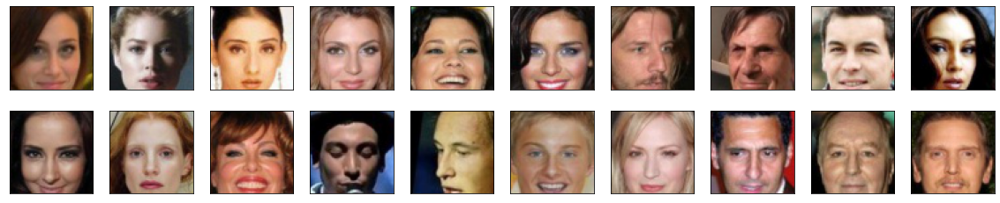

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:
from torch.nn import Module

import torch.nn as nn
import torch.nn.functional as F

In [8]:
class convBlock(Module):
    def __init__(self, in_channels, out_channels, kernel_size, batch_norm=True):
        super(convBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm=batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.ac = nn.LeakyReLU(0.2)
    def forward(self, x):
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.ac(x)
        return x

In [9]:
class Discriminator(Module):
    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.conv_dim = conv_dim
        self.conv1 = convBlock(3,conv_dim, 4, batch_norm=False) #32x32x64
        self.conv2 = convBlock(conv_dim, conv_dim*2, 4)         #16x16x128
        self.conv3 = convBlock(conv_dim*2, conv_dim*4, 4)       #8x8x256 
        self.conv4 = convBlock(conv_dim*4, conv_dim*6, 4)       #4x4x512 
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(conv_dim*4*4*6, 1)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x=self.conv1(x)
        x=self.conv2(x)
        x=self.conv3(x)
        x=self.conv4(x)
        x=self.flatten(x)
        x=self.fc(x)
        x=x.view(-1, 1, 1, 1)
        return x

In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator(64)
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [11]:
class DeconvBlock(Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, batch_norm=True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x):
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x       

In [12]:
class Generator(Module):
    def __init__(self, latent_dim: int, conv_dim=32):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        self.deconv1 = DeconvBlock(latent_dim, conv_dim*8, 4, 1, 0, 0)  #4*4
        self.deconv2 = DeconvBlock(conv_dim*8, conv_dim*6, 4, 2, 1)     #8*8
        self.deconv3 = DeconvBlock(conv_dim*6, conv_dim*4, 4, 2, 1)     #16*16
        self.deconv4 = DeconvBlock(conv_dim*4, conv_dim*2, 4, 2, 1)     #32*32
        #self.deconv5 = DeconvBlock(conv_dim*2, conv_dim, 4, 2, 1)     #64*64
        #self.deconv6 = DeconvBlock(conv_dim, conv_dim/2, 4, 2, 1)     #128*128
        self.deconv7 = nn.ConvTranspose2d(conv_dim*2, 3, 4, stride=2, padding=1) #256*256
        self.last_activation = nn.Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        #x = self.deconv5(x)
        #x = self.deconv6(x)
        x = self.deconv7(x)
        x = self.last_activation(x)
        return x

In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [14]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    g_optimizer = optim.Adam(generator.parameters(),lr=0.0002, betas=[0.5, 0.999]) 
    d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=[0.5, 0.999])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [15]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss
    target = torch.ones_like(fake_logits)
    
    if device=='cuda':
        target = target.cuda()
        
    criterion = nn.BCEWithLogitsLoss()
    loss = criterion(fake_logits, target)
    
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [16]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    
    real_target = torch.ones_like(real_logits)
    fake_target = torch.zeros_like(fake_logits)

    if device=='cuda':
        real_target = real_target.cuda()
        fake_target = fake_target.cuda()
    
    criterion = nn.BCEWithLogitsLoss()
    real_loss = criterion(real_logits, real_target)
    fake_loss = criterion(fake_logits, fake_target)

    loss = real_loss + fake_loss
    
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [17]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [18]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()
    
    noise = torch.randn(batch_size, latent_dim, 1, 1).to(device)
    
    if device=='cuda':
        noise = noise.to(device)
        
    fake_images = generator(noise)
    fake_logits = discriminator(fake_images)
    g_loss = generator_loss(fake_logits)

    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()
    
    if device=='cuda':
        real_images.to(device)
        
    noise = torch.randn(batch_size, latent_dim, 1, 1).to(device)
    
    if device=='cuda':
        noise = noise.to(device)
        
    fake_images = generator(noise)
    
    real_logits = discriminator(real_images)
    fake_logits = discriminator(fake_images)
    
    d_loss = discriminator_loss(real_logits, fake_logits)
    gp = gradient_penalty(discriminator, real_images, fake_images)
    
    (d_loss + gp).backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [19]:
from datetime import datetime

In [20]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 64

In [21]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-07-10 15:45:27 | Epoch [1/20] | Batch 0/509 | d_loss: 1.4888 | g_loss: 2.1892
2023-07-10 15:45:37 | Epoch [1/20] | Batch 50/509 | d_loss: 0.0007 | g_loss: 13.3335
2023-07-10 15:45:47 | Epoch [1/20] | Batch 100/509 | d_loss: 0.0225 | g_loss: 9.4246
2023-07-10 15:45:57 | Epoch [1/20] | Batch 150/509 | d_loss: 0.3912 | g_loss: 4.2387
2023-07-10 15:46:07 | Epoch [1/20] | Batch 200/509 | d_loss: 0.5694 | g_loss: 6.0708
2023-07-10 15:46:17 | Epoch [1/20] | Batch 250/509 | d_loss: 0.4293 | g_loss: 3.9339
2023-07-10 15:46:27 | Epoch [1/20] | Batch 300/509 | d_loss: 0.5772 | g_loss: 6.2751
2023-07-10 15:46:37 | Epoch [1/20] | Batch 350/509 | d_loss: 0.4024 | g_loss: 3.1392
2023-07-10 15:46:47 | Epoch [1/20] | Batch 400/509 | d_loss: 0.8035 | g_loss: 4.6299
2023-07-10 15:46:57 | Epoch [1/20] | Batch 450/509 | d_loss: 0.5707 | g_loss: 5.5157
2023-07-10 15:47:07 | Epoch [1/20] | Batch 500/509 | d_loss: 0.5268 | g_loss: 5.3688


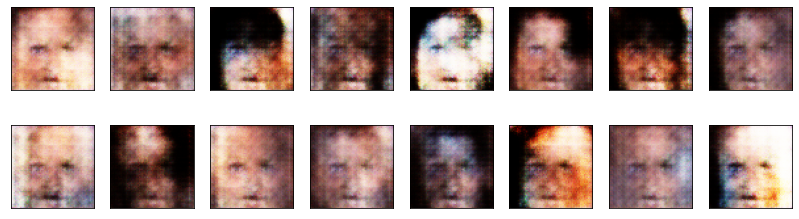

2023-07-10 15:47:11 | Epoch [2/20] | Batch 0/509 | d_loss: 0.2851 | g_loss: 4.7865
2023-07-10 15:47:21 | Epoch [2/20] | Batch 50/509 | d_loss: 0.2965 | g_loss: 3.4508
2023-07-10 15:47:31 | Epoch [2/20] | Batch 100/509 | d_loss: 0.3688 | g_loss: 3.9346
2023-07-10 15:47:41 | Epoch [2/20] | Batch 150/509 | d_loss: 0.2062 | g_loss: 3.5192
2023-07-10 15:47:51 | Epoch [2/20] | Batch 200/509 | d_loss: 0.4501 | g_loss: 5.5532
2023-07-10 15:48:01 | Epoch [2/20] | Batch 250/509 | d_loss: 0.8736 | g_loss: 7.9328
2023-07-10 15:48:11 | Epoch [2/20] | Batch 300/509 | d_loss: 0.2160 | g_loss: 5.1709
2023-07-10 15:48:21 | Epoch [2/20] | Batch 350/509 | d_loss: 0.1715 | g_loss: 5.7996
2023-07-10 15:48:31 | Epoch [2/20] | Batch 400/509 | d_loss: 0.9513 | g_loss: 7.3596
2023-07-10 15:48:41 | Epoch [2/20] | Batch 450/509 | d_loss: 0.5090 | g_loss: 3.9671
2023-07-10 15:48:51 | Epoch [2/20] | Batch 500/509 | d_loss: 0.3623 | g_loss: 4.9901


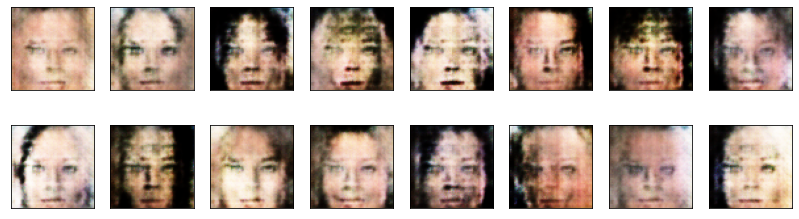

2023-07-10 15:48:56 | Epoch [3/20] | Batch 0/509 | d_loss: 0.4322 | g_loss: 4.1706
2023-07-10 15:49:06 | Epoch [3/20] | Batch 50/509 | d_loss: 1.2475 | g_loss: 1.6074
2023-07-10 15:49:16 | Epoch [3/20] | Batch 100/509 | d_loss: 0.3010 | g_loss: 3.5805
2023-07-10 15:49:26 | Epoch [3/20] | Batch 150/509 | d_loss: 0.3577 | g_loss: 4.0477
2023-07-10 15:49:36 | Epoch [3/20] | Batch 200/509 | d_loss: 1.3540 | g_loss: 1.8345
2023-07-10 15:49:46 | Epoch [3/20] | Batch 250/509 | d_loss: 0.7165 | g_loss: 6.3912
2023-07-10 15:49:56 | Epoch [3/20] | Batch 300/509 | d_loss: 0.3629 | g_loss: 2.9182
2023-07-10 15:50:06 | Epoch [3/20] | Batch 350/509 | d_loss: 1.0044 | g_loss: 9.7060
2023-07-10 15:50:16 | Epoch [3/20] | Batch 400/509 | d_loss: 0.6558 | g_loss: 5.6447
2023-07-10 15:50:26 | Epoch [3/20] | Batch 450/509 | d_loss: 0.3367 | g_loss: 3.6487
2023-07-10 15:50:36 | Epoch [3/20] | Batch 500/509 | d_loss: 0.4387 | g_loss: 3.5083


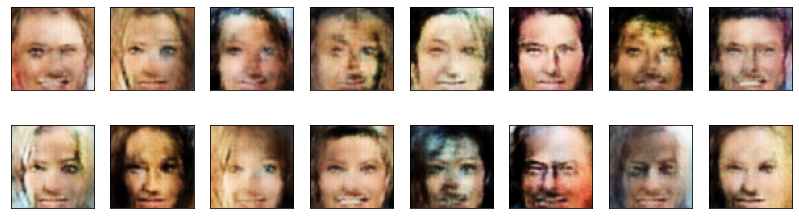

2023-07-10 15:50:40 | Epoch [4/20] | Batch 0/509 | d_loss: 0.2707 | g_loss: 3.9163
2023-07-10 15:50:50 | Epoch [4/20] | Batch 50/509 | d_loss: 0.2458 | g_loss: 4.8425
2023-07-10 15:51:00 | Epoch [4/20] | Batch 100/509 | d_loss: 0.4559 | g_loss: 4.3495
2023-07-10 15:51:10 | Epoch [4/20] | Batch 150/509 | d_loss: 0.3811 | g_loss: 3.5690
2023-07-10 15:51:21 | Epoch [4/20] | Batch 200/509 | d_loss: 0.4268 | g_loss: 3.3411
2023-07-10 15:51:31 | Epoch [4/20] | Batch 250/509 | d_loss: 0.2157 | g_loss: 4.0719
2023-07-10 15:51:41 | Epoch [4/20] | Batch 300/509 | d_loss: 0.6193 | g_loss: 6.0375
2023-07-10 15:51:52 | Epoch [4/20] | Batch 350/509 | d_loss: 0.3154 | g_loss: 2.2510
2023-07-10 15:52:03 | Epoch [4/20] | Batch 400/509 | d_loss: 0.4884 | g_loss: 2.6536
2023-07-10 15:52:13 | Epoch [4/20] | Batch 450/509 | d_loss: 0.2059 | g_loss: 4.6406
2023-07-10 15:52:23 | Epoch [4/20] | Batch 500/509 | d_loss: 0.2944 | g_loss: 3.1987


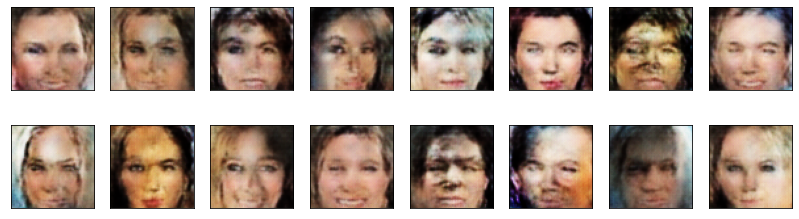

2023-07-10 15:52:27 | Epoch [5/20] | Batch 0/509 | d_loss: 0.1677 | g_loss: 3.5516
2023-07-10 15:52:37 | Epoch [5/20] | Batch 50/509 | d_loss: 0.1491 | g_loss: 3.6261
2023-07-10 15:52:47 | Epoch [5/20] | Batch 100/509 | d_loss: 0.3006 | g_loss: 3.8497
2023-07-10 15:52:57 | Epoch [5/20] | Batch 150/509 | d_loss: 0.1858 | g_loss: 5.1176
2023-07-10 15:53:07 | Epoch [5/20] | Batch 200/509 | d_loss: 0.6733 | g_loss: 6.0966
2023-07-10 15:53:17 | Epoch [5/20] | Batch 250/509 | d_loss: 0.1982 | g_loss: 3.3067
2023-07-10 15:53:27 | Epoch [5/20] | Batch 300/509 | d_loss: 0.3141 | g_loss: 4.4797
2023-07-10 15:53:37 | Epoch [5/20] | Batch 350/509 | d_loss: 0.4662 | g_loss: 4.9756
2023-07-10 15:53:48 | Epoch [5/20] | Batch 400/509 | d_loss: 0.2239 | g_loss: 4.4310
2023-07-10 15:53:58 | Epoch [5/20] | Batch 450/509 | d_loss: 0.2836 | g_loss: 5.1767
2023-07-10 15:54:08 | Epoch [5/20] | Batch 500/509 | d_loss: 0.2851 | g_loss: 3.4832


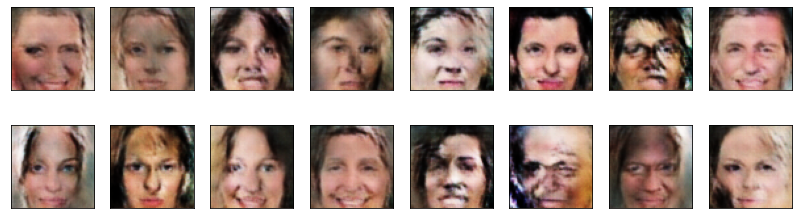

2023-07-10 15:54:12 | Epoch [6/20] | Batch 0/509 | d_loss: 0.2426 | g_loss: 3.7025
2023-07-10 15:54:22 | Epoch [6/20] | Batch 50/509 | d_loss: 0.2615 | g_loss: 3.7264
2023-07-10 15:54:32 | Epoch [6/20] | Batch 100/509 | d_loss: 0.8142 | g_loss: 5.0938
2023-07-10 15:54:44 | Epoch [6/20] | Batch 150/509 | d_loss: 0.3212 | g_loss: 7.7250
2023-07-10 15:54:55 | Epoch [6/20] | Batch 200/509 | d_loss: 0.4789 | g_loss: 3.2939
2023-07-10 15:55:07 | Epoch [6/20] | Batch 250/509 | d_loss: 0.2161 | g_loss: 4.3596
2023-07-10 15:55:17 | Epoch [6/20] | Batch 300/509 | d_loss: 0.4349 | g_loss: 3.3101
2023-07-10 15:55:28 | Epoch [6/20] | Batch 350/509 | d_loss: 0.2677 | g_loss: 4.3776
2023-07-10 15:55:39 | Epoch [6/20] | Batch 400/509 | d_loss: 0.4303 | g_loss: 3.5264
2023-07-10 15:55:49 | Epoch [6/20] | Batch 450/509 | d_loss: 0.5111 | g_loss: 2.1132
2023-07-10 15:56:01 | Epoch [6/20] | Batch 500/509 | d_loss: 0.3774 | g_loss: 5.0576


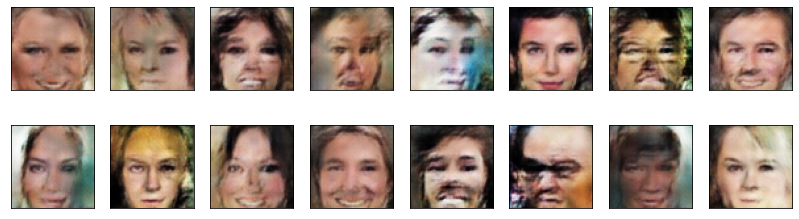

2023-07-10 15:56:05 | Epoch [7/20] | Batch 0/509 | d_loss: 0.1536 | g_loss: 4.9435
2023-07-10 15:56:16 | Epoch [7/20] | Batch 50/509 | d_loss: 0.4700 | g_loss: 3.5073
2023-07-10 15:56:27 | Epoch [7/20] | Batch 100/509 | d_loss: 0.2212 | g_loss: 3.8707
2023-07-10 15:56:38 | Epoch [7/20] | Batch 150/509 | d_loss: 0.2594 | g_loss: 6.6058
2023-07-10 15:56:49 | Epoch [7/20] | Batch 200/509 | d_loss: 0.2307 | g_loss: 3.9394
2023-07-10 15:57:00 | Epoch [7/20] | Batch 250/509 | d_loss: 0.3095 | g_loss: 2.2115
2023-07-10 15:57:11 | Epoch [7/20] | Batch 300/509 | d_loss: 0.1510 | g_loss: 3.3626
2023-07-10 15:57:22 | Epoch [7/20] | Batch 350/509 | d_loss: 0.2993 | g_loss: 5.1934
2023-07-10 15:57:33 | Epoch [7/20] | Batch 400/509 | d_loss: 0.4860 | g_loss: 3.4700
2023-07-10 15:57:43 | Epoch [7/20] | Batch 450/509 | d_loss: 0.8540 | g_loss: 7.8606
2023-07-10 15:57:53 | Epoch [7/20] | Batch 500/509 | d_loss: 0.1394 | g_loss: 4.9828


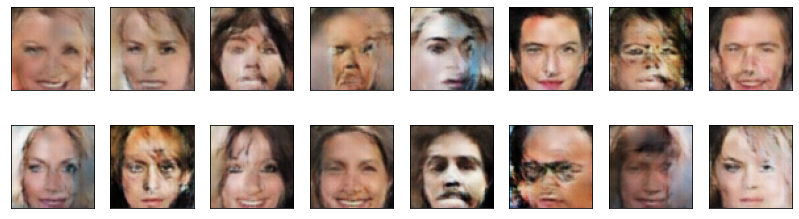

2023-07-10 15:57:58 | Epoch [8/20] | Batch 0/509 | d_loss: 0.1380 | g_loss: 3.5780
2023-07-10 15:58:08 | Epoch [8/20] | Batch 50/509 | d_loss: 0.4013 | g_loss: 4.4876
2023-07-10 15:58:18 | Epoch [8/20] | Batch 100/509 | d_loss: 0.1720 | g_loss: 3.1283
2023-07-10 15:58:28 | Epoch [8/20] | Batch 150/509 | d_loss: 0.1663 | g_loss: 4.3308
2023-07-10 15:58:38 | Epoch [8/20] | Batch 200/509 | d_loss: 0.1380 | g_loss: 4.2951
2023-07-10 15:58:48 | Epoch [8/20] | Batch 250/509 | d_loss: 0.1922 | g_loss: 4.7335
2023-07-10 15:58:58 | Epoch [8/20] | Batch 300/509 | d_loss: 0.2286 | g_loss: 3.9460
2023-07-10 15:59:08 | Epoch [8/20] | Batch 350/509 | d_loss: 0.1442 | g_loss: 4.4073
2023-07-10 15:59:18 | Epoch [8/20] | Batch 400/509 | d_loss: 0.1380 | g_loss: 2.7052
2023-07-10 15:59:28 | Epoch [8/20] | Batch 450/509 | d_loss: 1.4200 | g_loss: 8.4656
2023-07-10 15:59:38 | Epoch [8/20] | Batch 500/509 | d_loss: 0.1656 | g_loss: 3.7256


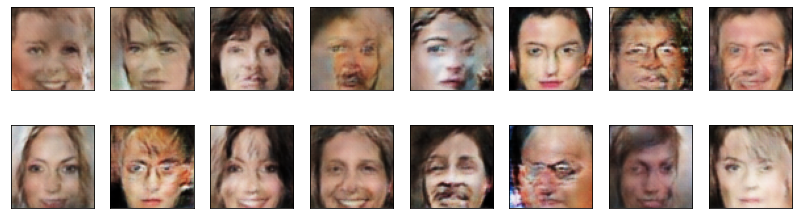

2023-07-10 15:59:42 | Epoch [9/20] | Batch 0/509 | d_loss: 1.8520 | g_loss: 3.8652
2023-07-10 15:59:52 | Epoch [9/20] | Batch 50/509 | d_loss: 0.1449 | g_loss: 3.1346
2023-07-10 16:00:02 | Epoch [9/20] | Batch 100/509 | d_loss: 0.3533 | g_loss: 3.5953
2023-07-10 16:00:12 | Epoch [9/20] | Batch 150/509 | d_loss: 0.1187 | g_loss: 3.6593
2023-07-10 16:00:22 | Epoch [9/20] | Batch 200/509 | d_loss: 0.0523 | g_loss: 4.4045
2023-07-10 16:00:32 | Epoch [9/20] | Batch 250/509 | d_loss: 0.0626 | g_loss: 5.3985
2023-07-10 16:00:42 | Epoch [9/20] | Batch 300/509 | d_loss: 0.4096 | g_loss: 6.0624
2023-07-10 16:00:52 | Epoch [9/20] | Batch 350/509 | d_loss: 0.0176 | g_loss: 4.4091
2023-07-10 16:01:02 | Epoch [9/20] | Batch 400/509 | d_loss: 0.0365 | g_loss: 5.0384
2023-07-10 16:01:12 | Epoch [9/20] | Batch 450/509 | d_loss: 0.0547 | g_loss: 5.9571
2023-07-10 16:01:22 | Epoch [9/20] | Batch 500/509 | d_loss: 0.3546 | g_loss: 4.6198


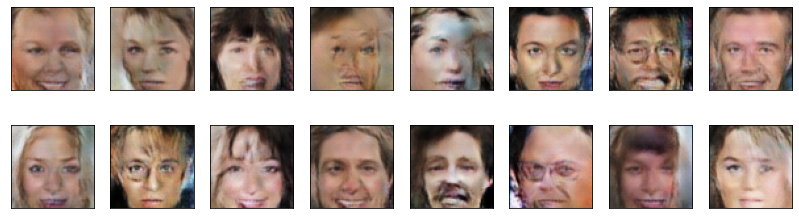

2023-07-10 16:01:26 | Epoch [10/20] | Batch 0/509 | d_loss: 0.0241 | g_loss: 7.0390
2023-07-10 16:01:36 | Epoch [10/20] | Batch 50/509 | d_loss: 0.3812 | g_loss: 8.3706
2023-07-10 16:01:46 | Epoch [10/20] | Batch 100/509 | d_loss: 0.3071 | g_loss: 5.5946
2023-07-10 16:01:57 | Epoch [10/20] | Batch 150/509 | d_loss: 0.0514 | g_loss: 5.0706
2023-07-10 16:02:07 | Epoch [10/20] | Batch 200/509 | d_loss: 0.0870 | g_loss: 4.4168
2023-07-10 16:02:17 | Epoch [10/20] | Batch 250/509 | d_loss: 0.1080 | g_loss: 4.5182
2023-07-10 16:02:27 | Epoch [10/20] | Batch 300/509 | d_loss: 0.1162 | g_loss: 4.1760
2023-07-10 16:02:37 | Epoch [10/20] | Batch 350/509 | d_loss: 0.3608 | g_loss: 4.5054
2023-07-10 16:02:47 | Epoch [10/20] | Batch 400/509 | d_loss: 0.0232 | g_loss: 5.4289
2023-07-10 16:02:57 | Epoch [10/20] | Batch 450/509 | d_loss: 1.7606 | g_loss: 7.9043
2023-07-10 16:03:07 | Epoch [10/20] | Batch 500/509 | d_loss: 0.2189 | g_loss: 3.4047


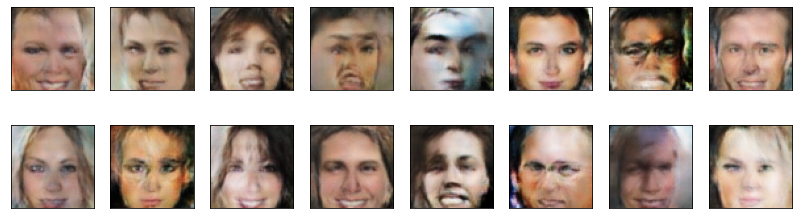

2023-07-10 16:03:12 | Epoch [11/20] | Batch 0/509 | d_loss: 0.1607 | g_loss: 5.2328
2023-07-10 16:03:22 | Epoch [11/20] | Batch 50/509 | d_loss: 0.0520 | g_loss: 5.1242
2023-07-10 16:03:32 | Epoch [11/20] | Batch 100/509 | d_loss: 0.2110 | g_loss: 4.4942
2023-07-10 16:03:42 | Epoch [11/20] | Batch 150/509 | d_loss: 0.0406 | g_loss: 3.9805
2023-07-10 16:03:52 | Epoch [11/20] | Batch 200/509 | d_loss: 0.1811 | g_loss: 2.8116
2023-07-10 16:04:02 | Epoch [11/20] | Batch 250/509 | d_loss: 1.0265 | g_loss: 9.0134
2023-07-10 16:04:12 | Epoch [11/20] | Batch 300/509 | d_loss: 0.0227 | g_loss: 4.9514
2023-07-10 16:04:22 | Epoch [11/20] | Batch 350/509 | d_loss: 0.1037 | g_loss: 4.5371
2023-07-10 16:04:32 | Epoch [11/20] | Batch 400/509 | d_loss: 0.0662 | g_loss: 4.5917
2023-07-10 16:04:42 | Epoch [11/20] | Batch 450/509 | d_loss: 0.0620 | g_loss: 3.2200
2023-07-10 16:04:52 | Epoch [11/20] | Batch 500/509 | d_loss: 0.3638 | g_loss: 2.6724


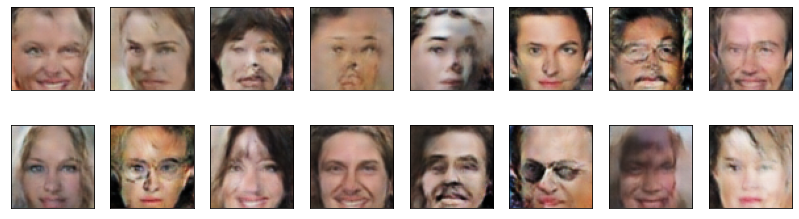

2023-07-10 16:04:56 | Epoch [12/20] | Batch 0/509 | d_loss: 0.1328 | g_loss: 4.9782
2023-07-10 16:05:06 | Epoch [12/20] | Batch 50/509 | d_loss: 0.0558 | g_loss: 4.6518
2023-07-10 16:05:16 | Epoch [12/20] | Batch 100/509 | d_loss: 0.2341 | g_loss: 2.4882
2023-07-10 16:05:26 | Epoch [12/20] | Batch 150/509 | d_loss: 0.0156 | g_loss: 4.0461
2023-07-10 16:05:36 | Epoch [12/20] | Batch 200/509 | d_loss: 0.0138 | g_loss: 5.0096
2023-07-10 16:05:46 | Epoch [12/20] | Batch 250/509 | d_loss: 0.0606 | g_loss: 5.7613
2023-07-10 16:05:56 | Epoch [12/20] | Batch 300/509 | d_loss: 0.0751 | g_loss: 5.1419
2023-07-10 16:06:06 | Epoch [12/20] | Batch 350/509 | d_loss: 0.0345 | g_loss: 4.8974
2023-07-10 16:06:16 | Epoch [12/20] | Batch 400/509 | d_loss: 0.1823 | g_loss: 5.1811
2023-07-10 16:06:26 | Epoch [12/20] | Batch 450/509 | d_loss: 0.1100 | g_loss: 2.9996
2023-07-10 16:06:36 | Epoch [12/20] | Batch 500/509 | d_loss: 0.2275 | g_loss: 6.9708


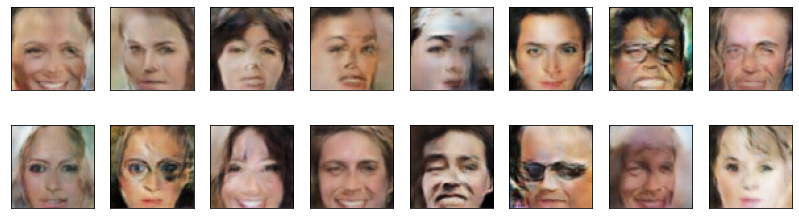

2023-07-10 16:06:41 | Epoch [13/20] | Batch 0/509 | d_loss: 0.0351 | g_loss: 5.0413
2023-07-10 16:06:51 | Epoch [13/20] | Batch 50/509 | d_loss: 0.1510 | g_loss: 6.8809
2023-07-10 16:07:01 | Epoch [13/20] | Batch 100/509 | d_loss: 0.1058 | g_loss: 3.9033
2023-07-10 16:07:11 | Epoch [13/20] | Batch 150/509 | d_loss: 0.2899 | g_loss: 3.5126
2023-07-10 16:07:21 | Epoch [13/20] | Batch 200/509 | d_loss: 0.0539 | g_loss: 5.8040
2023-07-10 16:07:31 | Epoch [13/20] | Batch 250/509 | d_loss: 1.0766 | g_loss: 10.3825
2023-07-10 16:07:41 | Epoch [13/20] | Batch 300/509 | d_loss: 0.0963 | g_loss: 4.3821
2023-07-10 16:07:51 | Epoch [13/20] | Batch 350/509 | d_loss: 0.1553 | g_loss: 4.7040
2023-07-10 16:08:01 | Epoch [13/20] | Batch 400/509 | d_loss: 0.3103 | g_loss: 5.8659
2023-07-10 16:08:11 | Epoch [13/20] | Batch 450/509 | d_loss: 0.0204 | g_loss: 6.1827
2023-07-10 16:08:21 | Epoch [13/20] | Batch 500/509 | d_loss: 0.0413 | g_loss: 6.8754


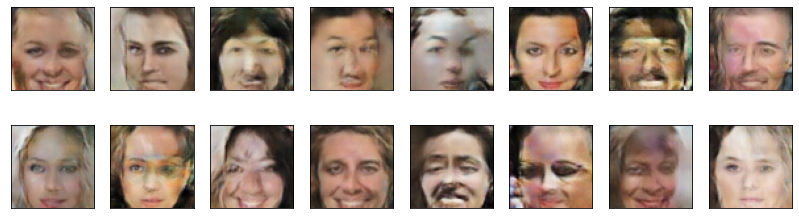

2023-07-10 16:08:26 | Epoch [14/20] | Batch 0/509 | d_loss: 0.0184 | g_loss: 7.1919
2023-07-10 16:08:36 | Epoch [14/20] | Batch 50/509 | d_loss: 0.1130 | g_loss: 5.7289
2023-07-10 16:08:46 | Epoch [14/20] | Batch 100/509 | d_loss: 0.0263 | g_loss: 5.5073
2023-07-10 16:08:56 | Epoch [14/20] | Batch 150/509 | d_loss: 0.6935 | g_loss: 9.3219
2023-07-10 16:09:06 | Epoch [14/20] | Batch 200/509 | d_loss: 0.1880 | g_loss: 7.3323
2023-07-10 16:09:16 | Epoch [14/20] | Batch 250/509 | d_loss: 0.0678 | g_loss: 6.5504
2023-07-10 16:09:26 | Epoch [14/20] | Batch 300/509 | d_loss: 0.0448 | g_loss: 6.5313
2023-07-10 16:09:36 | Epoch [14/20] | Batch 350/509 | d_loss: 0.0449 | g_loss: 5.4071
2023-07-10 16:09:46 | Epoch [14/20] | Batch 400/509 | d_loss: 0.1742 | g_loss: 5.1070
2023-07-10 16:09:56 | Epoch [14/20] | Batch 450/509 | d_loss: 0.0308 | g_loss: 4.8279
2023-07-10 16:10:06 | Epoch [14/20] | Batch 500/509 | d_loss: 0.0305 | g_loss: 4.8372


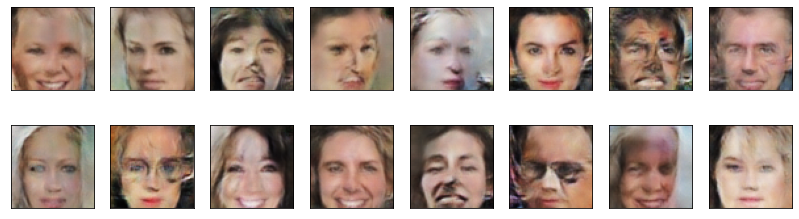

2023-07-10 16:10:10 | Epoch [15/20] | Batch 0/509 | d_loss: 0.2017 | g_loss: 6.0062
2023-07-10 16:10:20 | Epoch [15/20] | Batch 50/509 | d_loss: 0.2198 | g_loss: 5.5749
2023-07-10 16:10:30 | Epoch [15/20] | Batch 100/509 | d_loss: 0.1945 | g_loss: 4.3747
2023-07-10 16:10:40 | Epoch [15/20] | Batch 150/509 | d_loss: 0.1164 | g_loss: 5.3994
2023-07-10 16:10:50 | Epoch [15/20] | Batch 200/509 | d_loss: 0.0844 | g_loss: 6.1195
2023-07-10 16:11:00 | Epoch [15/20] | Batch 250/509 | d_loss: 0.0472 | g_loss: 3.5854
2023-07-10 16:11:10 | Epoch [15/20] | Batch 300/509 | d_loss: 0.0302 | g_loss: 6.9397
2023-07-10 16:11:20 | Epoch [15/20] | Batch 350/509 | d_loss: 0.0136 | g_loss: 6.5540
2023-07-10 16:11:30 | Epoch [15/20] | Batch 400/509 | d_loss: 0.2081 | g_loss: 3.9595
2023-07-10 16:11:40 | Epoch [15/20] | Batch 450/509 | d_loss: 0.1204 | g_loss: 8.4913
2023-07-10 16:11:50 | Epoch [15/20] | Batch 500/509 | d_loss: 0.1086 | g_loss: 4.5629


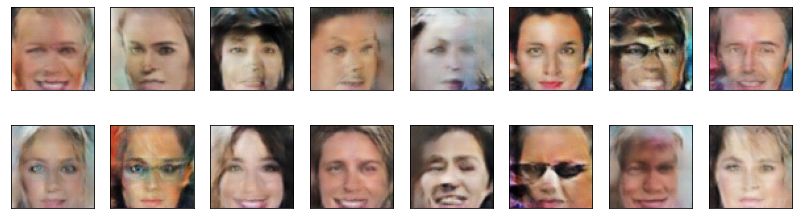

2023-07-10 16:11:55 | Epoch [16/20] | Batch 0/509 | d_loss: 0.0715 | g_loss: 3.9818
2023-07-10 16:12:05 | Epoch [16/20] | Batch 50/509 | d_loss: 0.0249 | g_loss: 6.2793
2023-07-10 16:12:15 | Epoch [16/20] | Batch 100/509 | d_loss: 0.0628 | g_loss: 6.1190
2023-07-10 16:12:25 | Epoch [16/20] | Batch 150/509 | d_loss: 0.0963 | g_loss: 4.7552
2023-07-10 16:12:35 | Epoch [16/20] | Batch 200/509 | d_loss: 0.0340 | g_loss: 7.3985
2023-07-10 16:12:45 | Epoch [16/20] | Batch 250/509 | d_loss: 0.1729 | g_loss: 6.1333
2023-07-10 16:12:55 | Epoch [16/20] | Batch 300/509 | d_loss: 0.4442 | g_loss: 3.7186
2023-07-10 16:13:05 | Epoch [16/20] | Batch 350/509 | d_loss: 0.0266 | g_loss: 6.5569
2023-07-10 16:13:15 | Epoch [16/20] | Batch 400/509 | d_loss: 0.1221 | g_loss: 5.2202
2023-07-10 16:13:25 | Epoch [16/20] | Batch 450/509 | d_loss: 0.0505 | g_loss: 4.5518
2023-07-10 16:13:35 | Epoch [16/20] | Batch 500/509 | d_loss: 0.0115 | g_loss: 6.1584


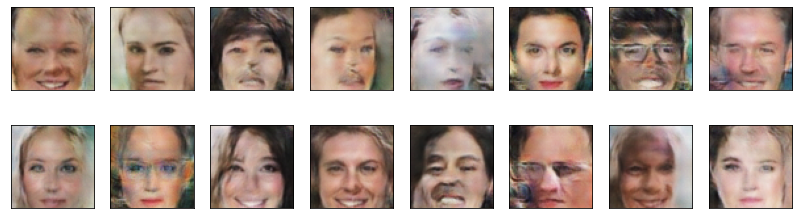

2023-07-10 16:13:39 | Epoch [17/20] | Batch 0/509 | d_loss: 0.3082 | g_loss: 6.5664
2023-07-10 16:13:49 | Epoch [17/20] | Batch 50/509 | d_loss: 0.2540 | g_loss: 6.7671
2023-07-10 16:13:59 | Epoch [17/20] | Batch 100/509 | d_loss: 0.0421 | g_loss: 4.0426
2023-07-10 16:14:09 | Epoch [17/20] | Batch 150/509 | d_loss: 0.0656 | g_loss: 3.9197
2023-07-10 16:14:19 | Epoch [17/20] | Batch 200/509 | d_loss: 0.0167 | g_loss: 6.1063
2023-07-10 16:14:29 | Epoch [17/20] | Batch 250/509 | d_loss: 0.3291 | g_loss: 5.0758
2023-07-10 16:14:39 | Epoch [17/20] | Batch 300/509 | d_loss: 0.0328 | g_loss: 6.3446
2023-07-10 16:14:49 | Epoch [17/20] | Batch 350/509 | d_loss: 0.0127 | g_loss: 4.6428
2023-07-10 16:14:59 | Epoch [17/20] | Batch 400/509 | d_loss: 0.0236 | g_loss: 4.3383
2023-07-10 16:15:09 | Epoch [17/20] | Batch 450/509 | d_loss: 0.0438 | g_loss: 6.0251
2023-07-10 16:15:19 | Epoch [17/20] | Batch 500/509 | d_loss: 0.0122 | g_loss: 8.0022


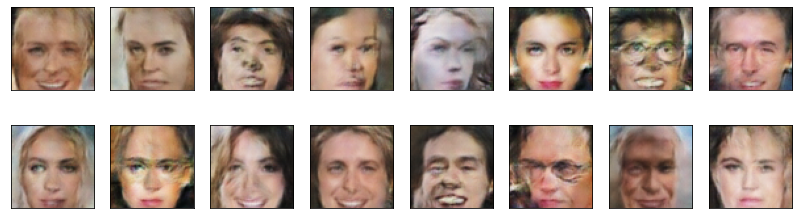

2023-07-10 16:15:23 | Epoch [18/20] | Batch 0/509 | d_loss: 0.2393 | g_loss: 5.9879
2023-07-10 16:15:33 | Epoch [18/20] | Batch 50/509 | d_loss: 0.1226 | g_loss: 4.7955
2023-07-10 16:15:43 | Epoch [18/20] | Batch 100/509 | d_loss: 0.0370 | g_loss: 4.0672
2023-07-10 16:15:53 | Epoch [18/20] | Batch 150/509 | d_loss: 0.0994 | g_loss: 4.8020
2023-07-10 16:16:03 | Epoch [18/20] | Batch 200/509 | d_loss: 0.1493 | g_loss: 6.7033
2023-07-10 16:16:13 | Epoch [18/20] | Batch 250/509 | d_loss: 0.0916 | g_loss: 5.6970
2023-07-10 16:16:23 | Epoch [18/20] | Batch 300/509 | d_loss: 0.0147 | g_loss: 6.7771
2023-07-10 16:16:33 | Epoch [18/20] | Batch 350/509 | d_loss: 0.3052 | g_loss: 7.0269
2023-07-10 16:16:43 | Epoch [18/20] | Batch 400/509 | d_loss: 0.2397 | g_loss: 4.9381
2023-07-10 16:16:53 | Epoch [18/20] | Batch 450/509 | d_loss: 0.0596 | g_loss: 5.0517
2023-07-10 16:17:03 | Epoch [18/20] | Batch 500/509 | d_loss: 0.0136 | g_loss: 5.9679


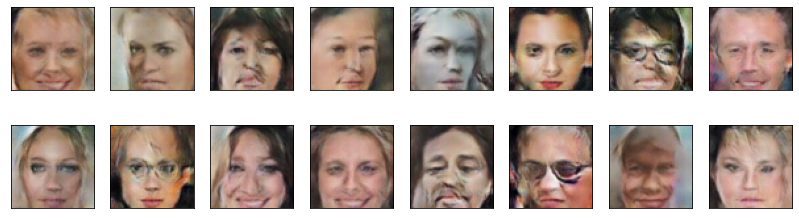

2023-07-10 16:17:08 | Epoch [19/20] | Batch 0/509 | d_loss: 0.0334 | g_loss: 6.2342
2023-07-10 16:17:18 | Epoch [19/20] | Batch 50/509 | d_loss: 0.0121 | g_loss: 5.9800
2023-07-10 16:17:28 | Epoch [19/20] | Batch 100/509 | d_loss: 0.2260 | g_loss: 7.2354
2023-07-10 16:17:38 | Epoch [19/20] | Batch 150/509 | d_loss: 0.2911 | g_loss: 7.4763
2023-07-10 16:17:48 | Epoch [19/20] | Batch 200/509 | d_loss: 0.1042 | g_loss: 6.0732
2023-07-10 16:17:58 | Epoch [19/20] | Batch 250/509 | d_loss: 0.4598 | g_loss: 7.8801
2023-07-10 16:18:08 | Epoch [19/20] | Batch 300/509 | d_loss: 0.1764 | g_loss: 9.1069
2023-07-10 16:18:18 | Epoch [19/20] | Batch 350/509 | d_loss: 0.1005 | g_loss: 4.7474
2023-07-10 16:18:28 | Epoch [19/20] | Batch 400/509 | d_loss: 0.0442 | g_loss: 4.2638
2023-07-10 16:18:38 | Epoch [19/20] | Batch 450/509 | d_loss: 0.0112 | g_loss: 7.3021


In [ ]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        g_loss = generator_step(batch_size, latent_dim)
        
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

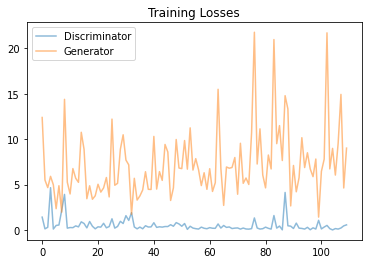

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 
- As noted above, the biased dataset makes the generated faces also biased. The are mostly white, and most of them follow celebrities that often don't reflect what the real people look like.
- The photo angles are not identical. If all images are taken from same angle, it would be easier for the network to train.
- Low resolution of the dataset images makes it harder to add more CNN layers.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.